### CHD risk(10 years) dataset Analysis

#####  After performing exploration and preprocessing on the coronary heart disease risk dataset (10-year risk), I obtained a new version of the dataset

##### with additional features derived from feature engineering applied to numeric columns. I also made preprocessing, making the data ready for analysis.

### Key Features.

* gender – The biological sex of the person (male or female), which can affect heart disease risk.

* age – The person's age in years; older individuals have a higher risk of heart disease.

* education – The number of years or level of formal education completed by the person.

* education_cat – A categorized version of the education level, grouping individuals into different education categories.

* currentSmoker – Indicates whether the person is currently smoking (1 = Yes, 0 = No); smoking increases heart disease risk.

* cigsPerDay – The number of cigarettes the person smokes per day; more cigarettes lead to higher risk.

* BPMeds – Whether the person is taking blood pressure medication (1 = Yes, 0 = No), which helps manage hypertension.

* prevalentStroke – Indicates if the person has had a stroke before (1 = Yes, 0 = No); having a stroke increases heart disease risk.

* prevalentHyp – Whether the person has a history of hypertension (high blood pressure), which is a major risk factor for heart disease.

* diabetes – Whether the person has diabetes (1 = Yes, 0 = No), which increases the risk of heart disease.

* totChol – The total cholesterol level in the blood; high cholesterol can contribute to heart disease.

* totChol_cat – A categorized version of total cholesterol levels, grouping individuals based on cholesterol risk categories.

* sysBP – Systolic blood pressure (the pressure in arteries when the heart beats); high levels can indicate heart disease risk.

* diaBP – Diastolic blood pressure (the pressure in arteries when the heart is resting between beats).

* BP_Cat – A categorized version of blood pressure, classifying individuals into normal, pre-hypertensive, or hypertensive groups.

* BMI – Body Mass Index, calculated from weight and height to determine if a person has a healthy weight for their height.

* BMI_cat – A categorized version of BMI, grouping individuals into underweight, normal weight, overweight, or obese categories.

* heartRate – The number of heartbeats per minute while at rest; an abnormal heart rate can signal heart issues.

* heartRate_cat – A categorized version of heart rate, grouping individuals into low, normal, or high heart rate categories.

* glucose – The blood sugar level; high glucose levels can indicate diabetes, which is a heart disease risk factor.

* glucose_cat – A categorized version of glucose levels, classifying individuals into normal, prediabetic, or diabetic groups.

* TenYearCHD – The predicted risk of developing coronary heart disease within the next 10 years (1 = High risk, 0 = Low risk).



### Load Libraries

In [6]:
import numpy as np
import pandas as pd
import plotly.express as px

### Read Dataset

In [9]:
df=pd.read_csv("predict-CHD.csv")

### Data Overview

In [8]:
df.head()

,gender,age,education,education_cat,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,...,sysBP,diaBP,BP_Cat,BMI,BMI_cat,heartRate,heartRate_cat,glucose,glucose_cat,TenYearCHD
0,male,39.0,4.0,advanced level,No,0.0,No,No,No,No,...,106.0,70.0,Normal,26.97,Overweight,80.0,Normal,77.0,Normal,No
1,female,46.0,2.0,intermediate level,No,0.0,No,No,No,No,...,121.0,81.0,High (Hypertension Stage 1),28.73,Overweight,95.0,Normal,76.0,Normal,No
2,male,48.0,1.0,low level,Yes,20.0,No,No,No,No,...,127.5,80.0,High (Hypertension Stage 1),25.34,Overweight,75.0,Normal,70.0,Normal,No
3,female,61.0,3.0,high level,Yes,30.0,No,No,Yes,No,...,150.0,95.0,High (Hypertension Stage 2),28.58,Overweight,65.0,Normal,103.0,Prediabetes,Yes
4,female,46.0,3.0,high level,Yes,23.0,No,No,No,No,...,130.0,84.0,High (Hypertension Stage 1),23.10,Normal Weight,85.0,Normal,85.0,Normal,No


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4240 entries, 0 to 4239
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   gender           4240 non-null   object 
 1   age              4240 non-null   float64
 2   education        4240 non-null   float64
 3   education_cat    4240 non-null   object 
 4   currentSmoker    4240 non-null   object 
 5   cigsPerDay       4240 non-null   float64
 6   BPMeds           4240 non-null   object 
 7   prevalentStroke  4240 non-null   object 
 8   prevalentHyp     4240 non-null   object 
 9   diabetes         4240 non-null   object 
 10  totChol          4240 non-null   float64
 11  totChol_cat      4240 non-null   object 
 12  sysBP            4240 non-null   float64
 13  diaBP            4240 non-null   float64
 14  BP_Cat           4240 non-null   object 
 15  BMI              4240 non-null   float64
 16  BMI_cat          4240 non-null   object 
 17  heartRate     

### Univariate Analysis

### What is the count of occurence for each gender in CHD risk

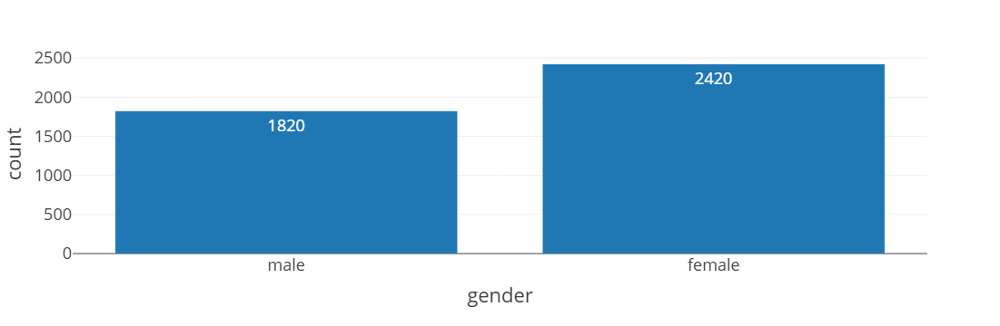

In [12]:
px.histogram(data_frame=df,x="gender",text_auto=True,template="presentation")

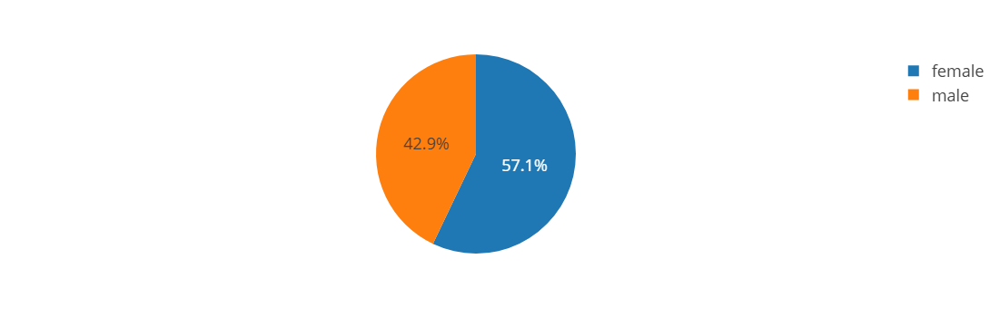

In [13]:
px.pie(data_frame=df,names="gender",template="presentation")

### What is the ranges of age for the cases that I have

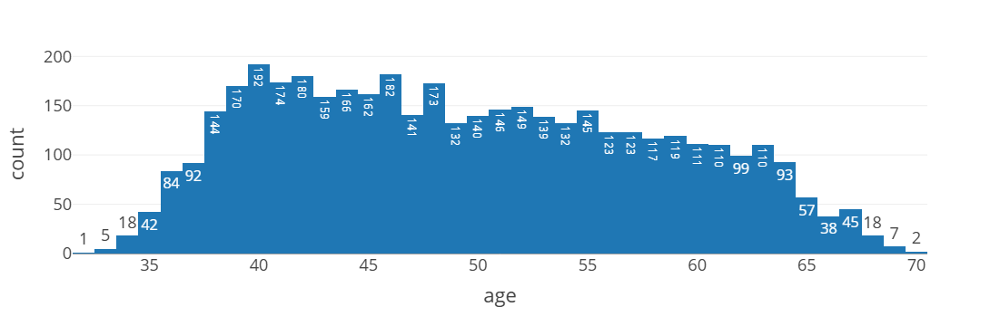

In [15]:
px.histogram(data_frame=df,x="age",text_auto=True,template="presentation")

### what is the count of occurence for every education for all cases that I have

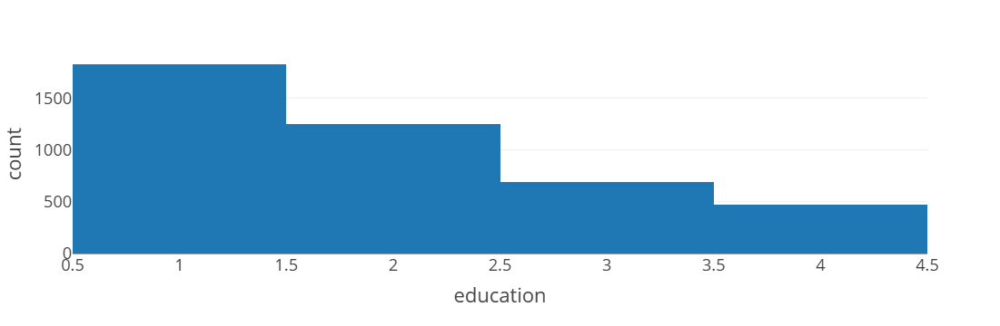

In [17]:
px.histogram(data_frame=df,x="education",template="presentation")

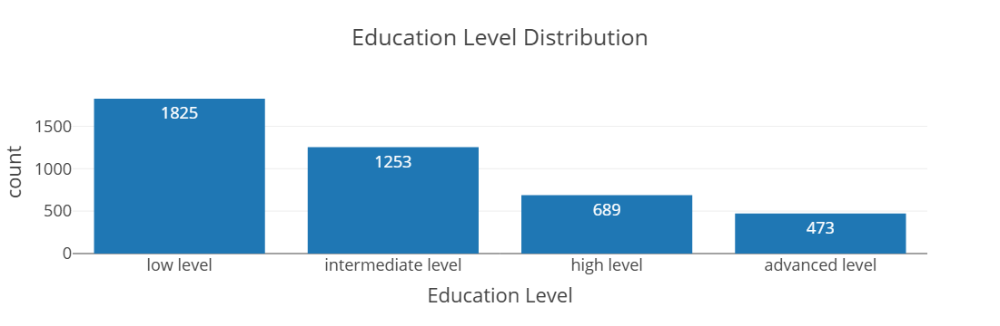

In [18]:
category_order = ['low level', 'intermediate level', 'high level', 'advanced level']
px.histogram(df, x='education_cat', title='Education Level Distribution',
             category_orders={"education_cat": ['low level', 'intermediate level', 'high level', 'advanced level']},
             labels={'education_cat': 'Education Level', 'count': 'Count'},
             text_auto=True,template="presentation") 

### How many individuals in the dataset are smokers

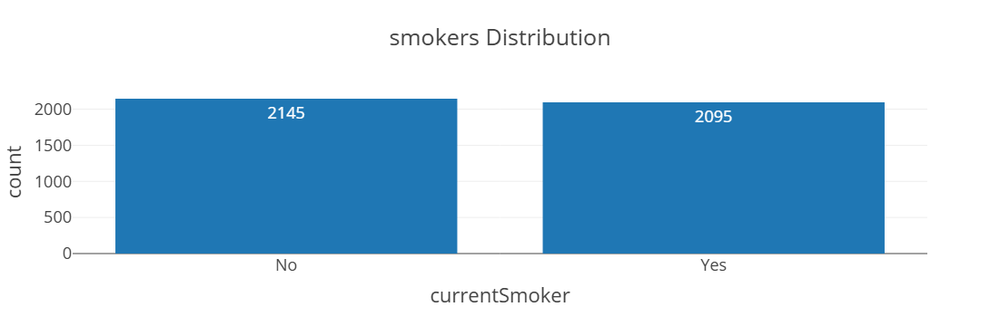

In [20]:
px.histogram(data_frame=df,x="currentSmoker",text_auto=True,title="smokers Distribution",template="presentation")

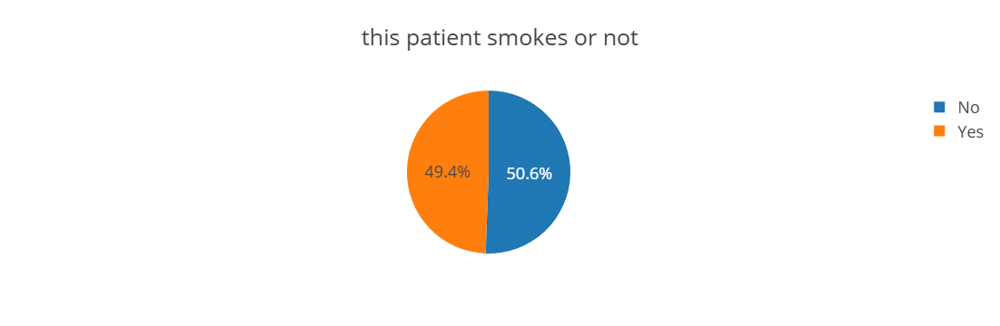

In [21]:
px.pie(data_frame=df,names="currentSmoker",title="this patient smokes or not",template="presentation")

#### What is the distribution of cigarettes smoked per day among individuals

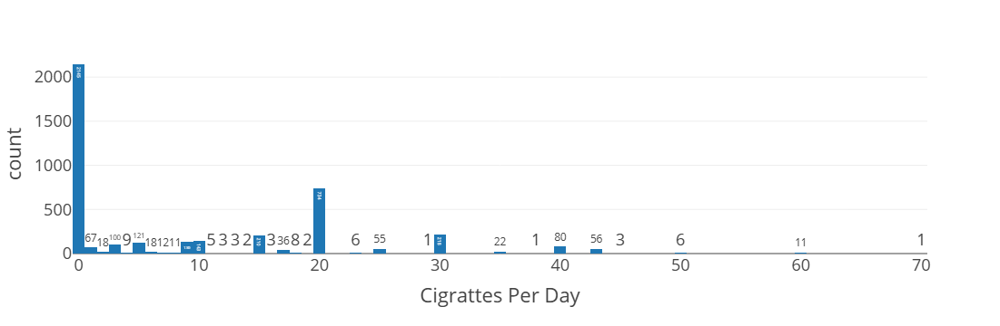

In [23]:
px.histogram(data_frame=df,x="cigsPerDay",text_auto=True,
            labels={"cigsPerDay":"Cigrattes Per Day"},template="presentation")

### Is this indvidual takes blood pressure medication or not

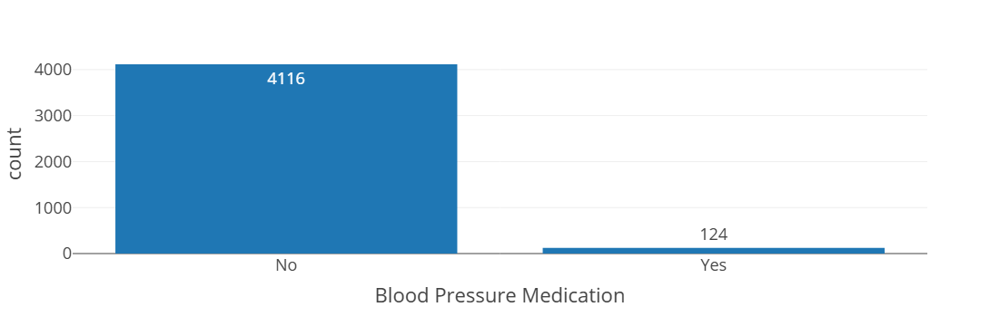

In [25]:
px.histogram(data_frame=df,x="BPMeds",text_auto=True,template='presentation',
            labels={"BPMeds":"Blood Pressure Medication"})

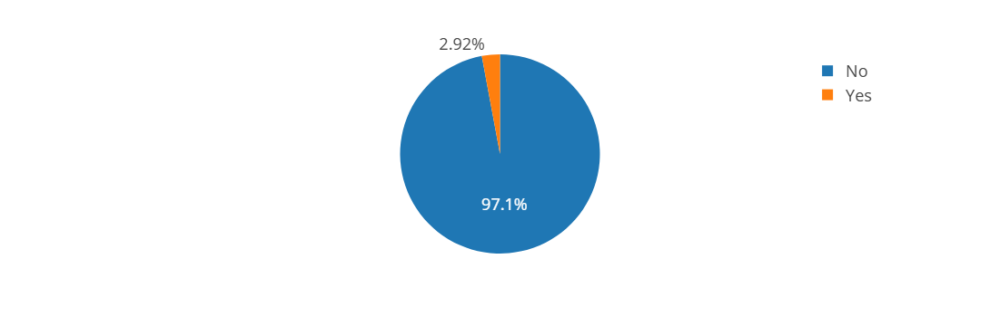

In [26]:
px.pie(data_frame=df,names='BPMeds',template='presentation')

### Do individuals have a prevalent stroke or not

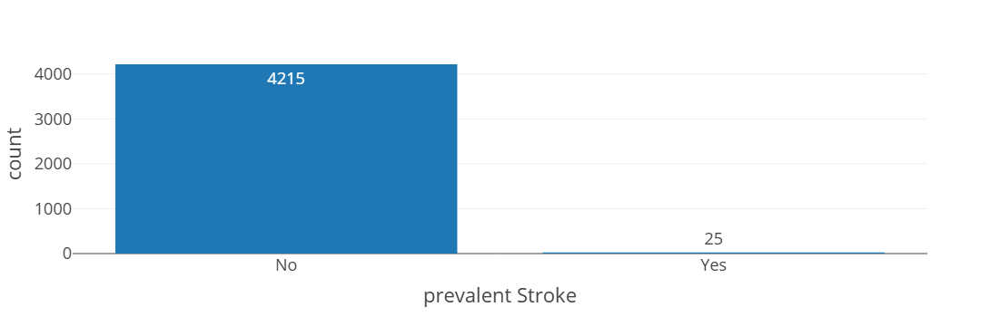

In [28]:
px.histogram(data_frame=df,x="prevalentStroke",text_auto=True,template='presentation',
            labels={"prevalentStroke":"prevalent Stroke"})

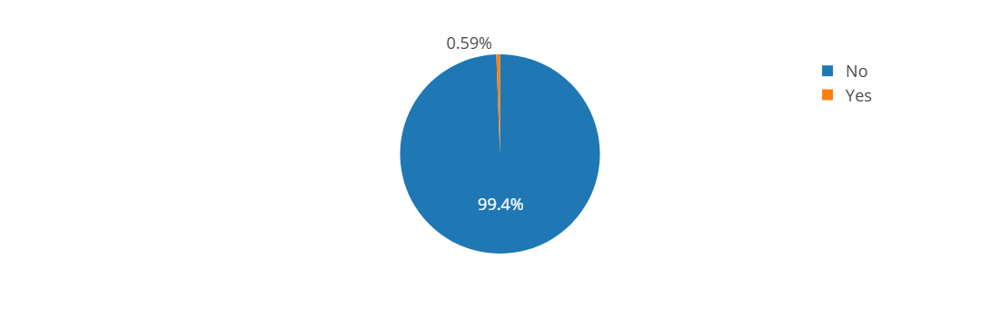

In [29]:
px.pie(data_frame=df,names='prevalentStroke',template="presentation")

### Do individuals have a prevalent Hypertenstion or not

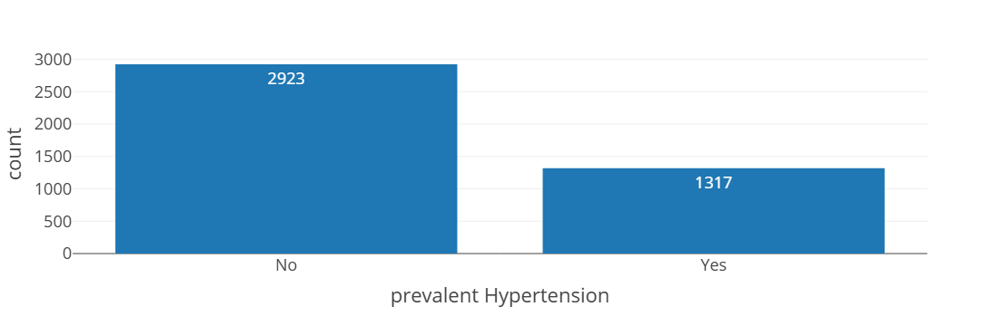

In [31]:
px.histogram(data_frame=df,x="prevalentHyp",text_auto=True,template='presentation',
            labels={"prevalentHyp":"prevalent Hypertension"})

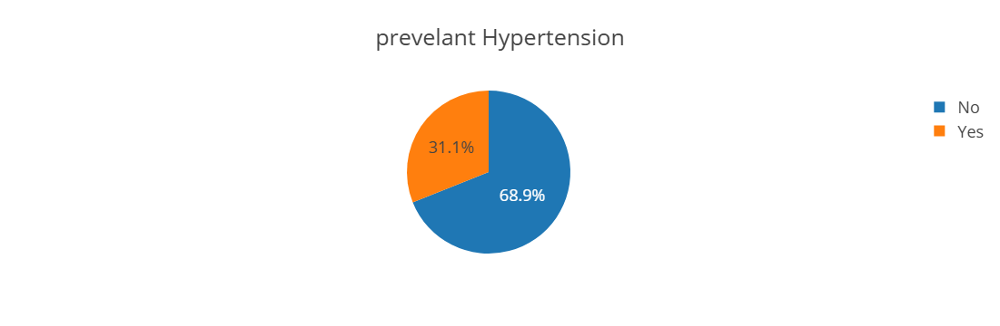

In [32]:
px.pie(data_frame=df,names="prevalentHyp",template="presentation",title="prevelant Hypertension")

### indviduals have a diabetes or not

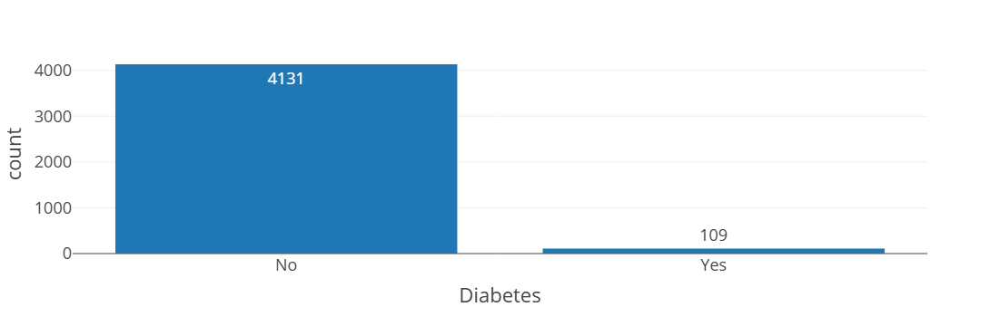

In [34]:
px.histogram(data_frame=df,x="diabetes",text_auto=True,template='presentation',
            labels={"diabetes":"Diabetes"})

### What is the distrbuition of total cholestral among patients

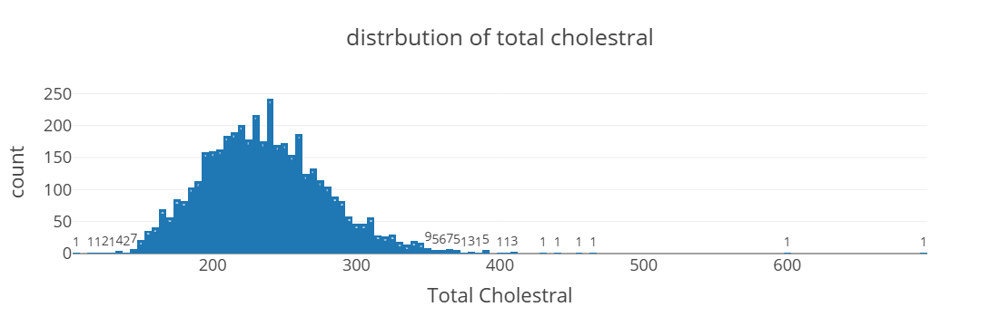

In [36]:
px.histogram(data_frame=df,x="totChol",
            labels={"totChol":"Total Cholestral"},text_auto=True,template="presentation",
            title="distrbution of total cholestral")

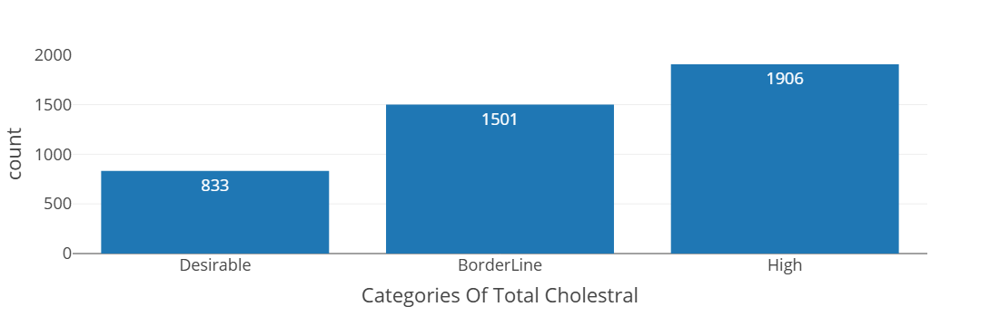

In [37]:
px.histogram(data_frame=df,x="totChol_cat",text_auto=True,
            category_orders={"totChol_cat":["Desirable","BorderLine","High"]},template="presentation",
            labels={"totChol_cat":"Categories Of Total Cholestral"})

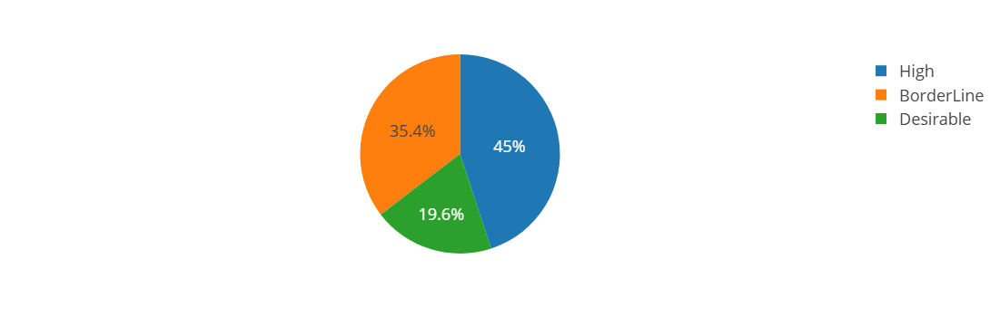

In [38]:
px.pie(data_frame=df,names="totChol_cat",template="presentation")

### what is the distribution of systolic blood pressure

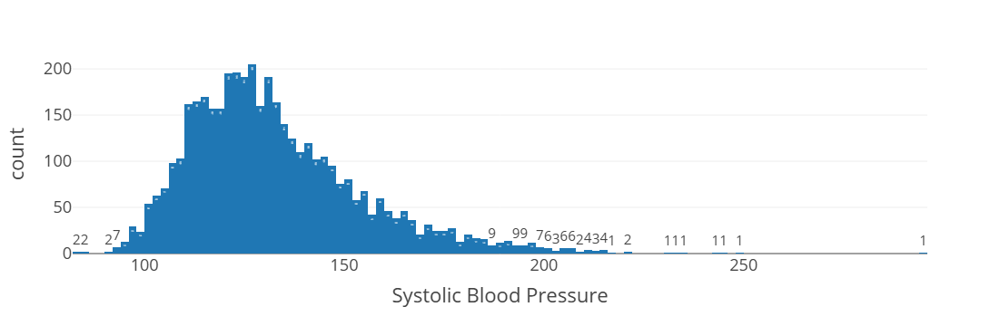

In [40]:
px.histogram(data_frame=df,x="sysBP",text_auto=True,
            template="presentation",labels={"sysBP":"Systolic Blood Pressure"})

### What is the distrbution of diastolic blood pressure

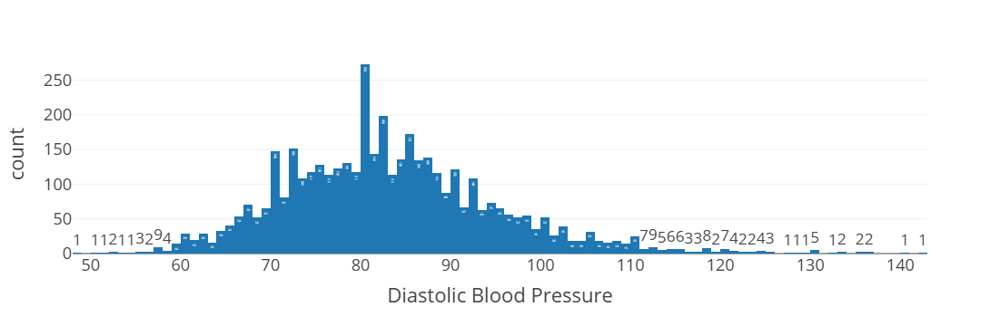

In [42]:
px.histogram(data_frame=df,x="diaBP",text_auto=True,
            template="presentation",labels={"diaBP":"Diastolic Blood Pressure"})

#### What is the distribution of blood pressure categories

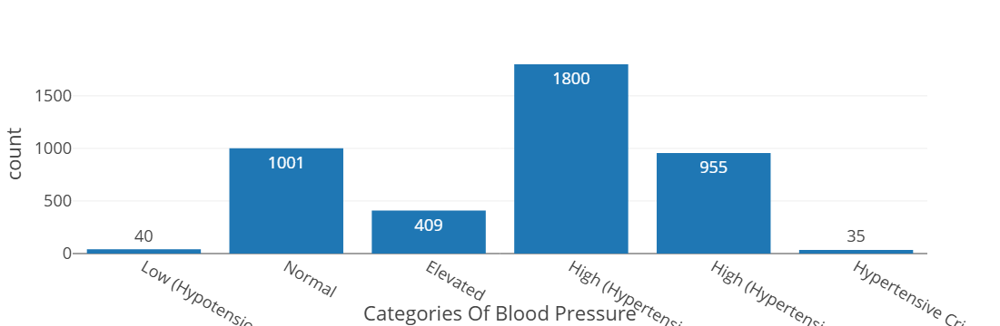

In [509]:
px.histogram(data_frame=df,x="BP_Cat",text_auto=True,
             category_orders={"BP_Cat":['Low (Hypotension)',"Normal","Elevated","High (Hypertension Stage 1)","High (Hypertension Stage 2)",
                                        "Hypertensive Crisis (Seek Medical Attention)"]},
             template="presentation",
            labels={"BP_Cat":"Categories Of Blood Pressure"})

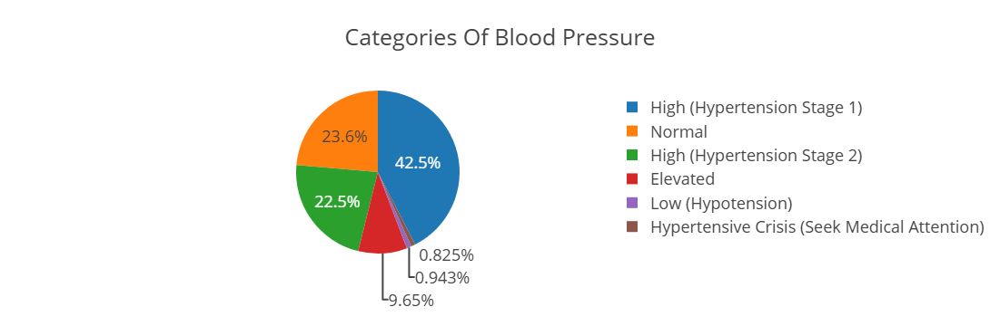

In [45]:
px.pie(data_frame=df,names="BP_Cat",template="presentation",title="Categories Of Blood Pressure")

### What is the distribution of body mass index among indviduals

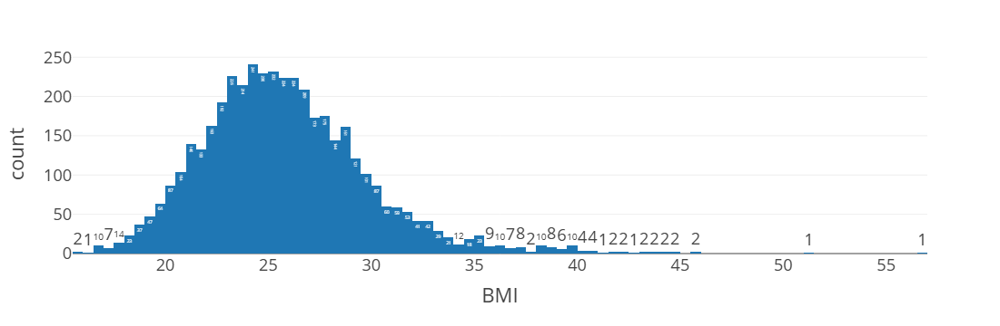

In [47]:
px.histogram(data_frame=df,x="BMI",text_auto=True,template='presentation')

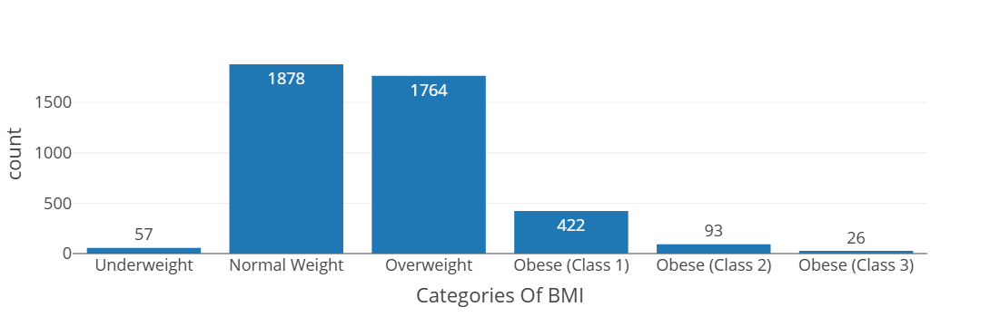

In [48]:
px.histogram(data_frame=df,x="BMI_cat",template='presentation',text_auto=True,
            labels={"BMI_cat":"Categories Of BMI"},
            category_orders={"BMI_cat":["Underweight","Normal Weight","Overweight",
                                       "Obese (Class 1)","Obese (Class 2)","Obese (Class 3)"]})

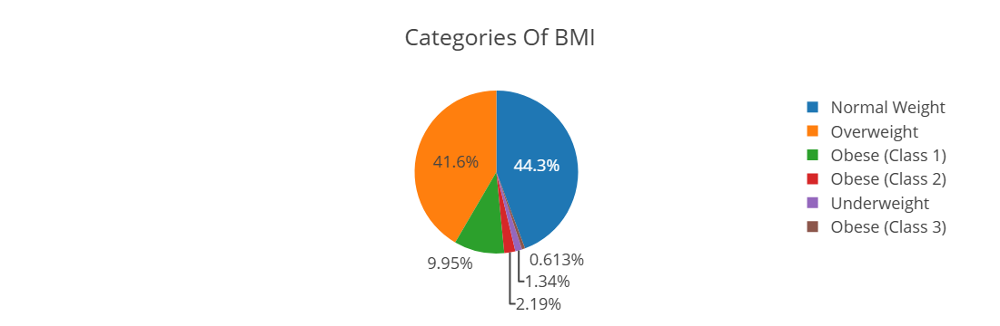

In [49]:
px.pie(data_frame=df,names='BMI_cat',title="Categories Of BMI",template='presentation')

### What is the distribution of heart rate

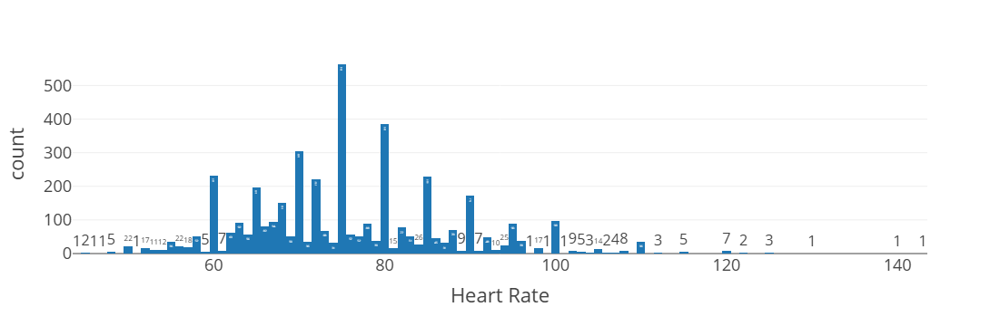

In [51]:
px.histogram(data_frame=df,x="heartRate",text_auto=True,template='presentation',
            labels={"heartRate":"Heart Rate"})

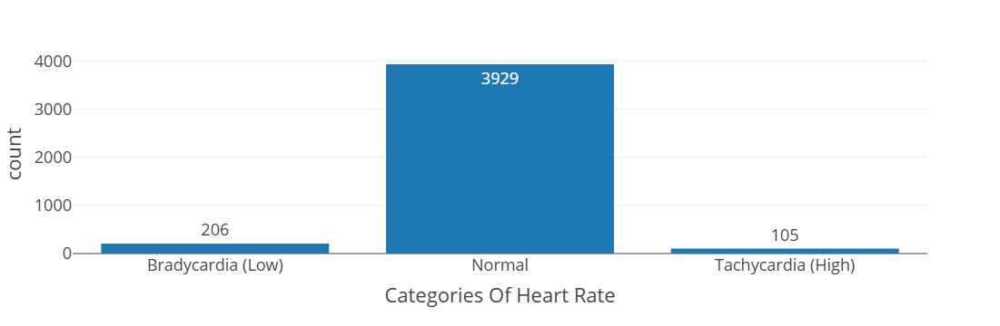

In [52]:
px.histogram(data_frame=df,x="heartRate_cat",template='presentation',text_auto=True,
            category_orders={"heartRate_cat":["Bradycardia (Low)","Normal","Tachycardia (High)"]},
            labels={"heartRate_cat":"Categories Of Heart Rate"})

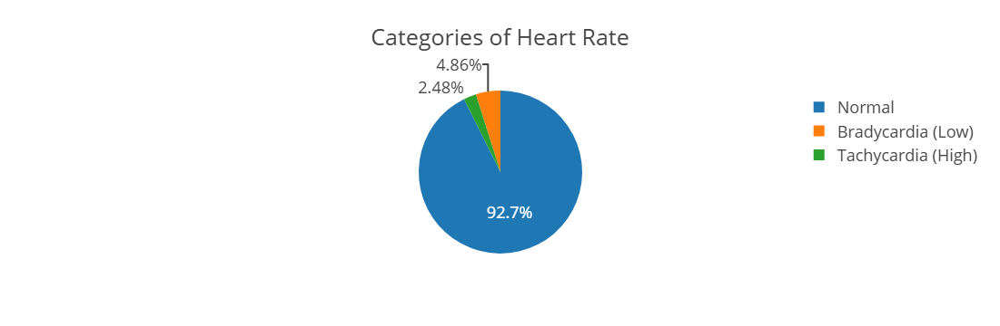

In [53]:
px.pie(data_frame=df,names="heartRate_cat",template="presentation",title="Categories of Heart Rate")

### What is the distribution of glucose

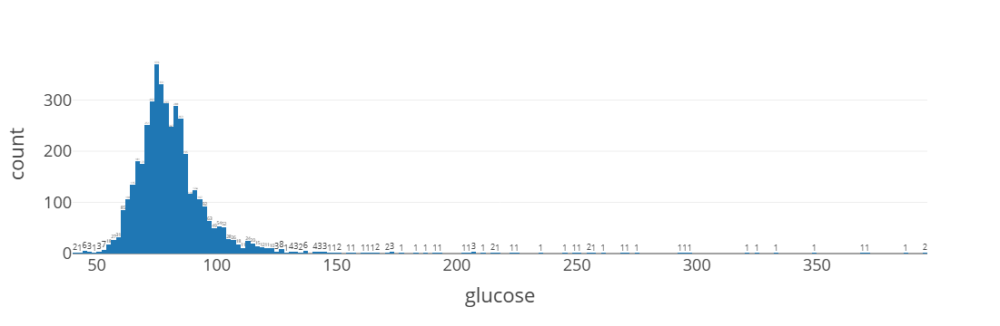

In [55]:
px.histogram(data_frame=df,x="glucose",text_auto=True,template='presentation',
            )

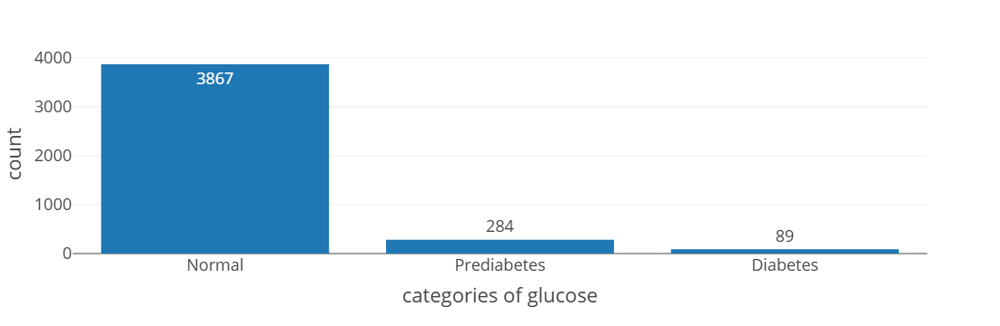

In [56]:
px.histogram(data_frame=df,x="glucose_cat",text_auto=True,template='presentation',
            labels={"glucose_cat":"categories of glucose"})

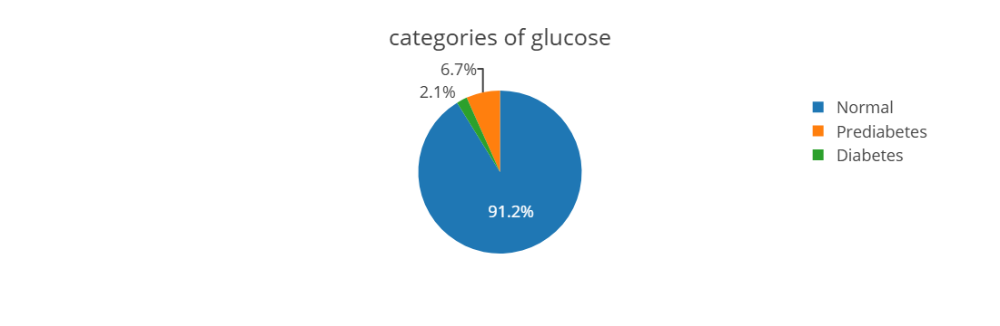

In [57]:
px.pie(data_frame=df,names="glucose_cat",title="categories of glucose",template="presentation")

### What is the prediction of coronary heart disease risk in the future of 10 years

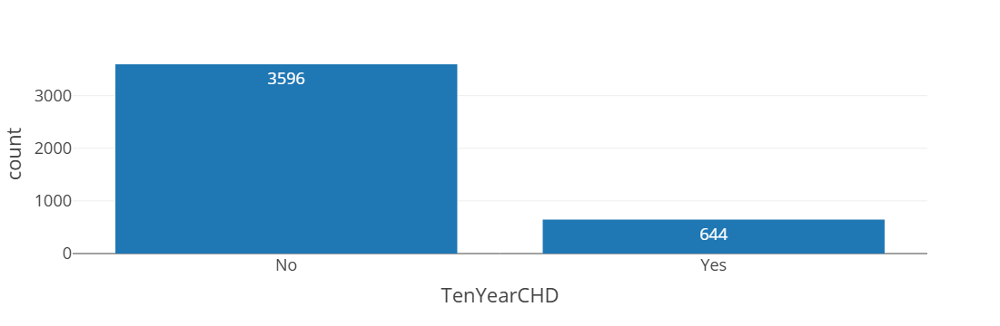

In [59]:
px.histogram(data_frame=df,x="TenYearCHD",template="presentation",text_auto=True)

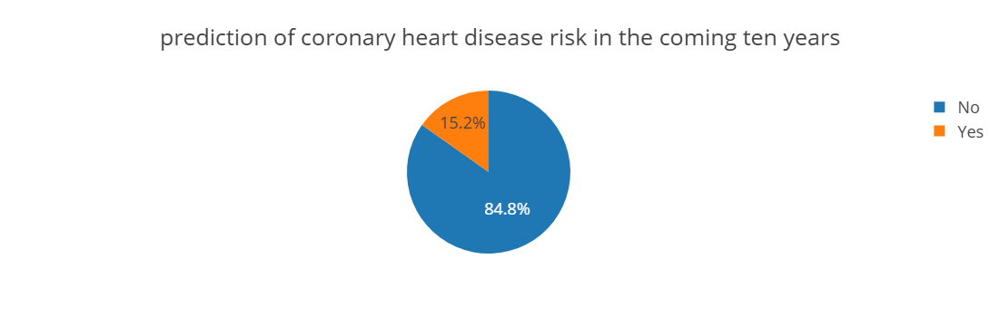

In [60]:
px.pie(data_frame=df,names="TenYearCHD",template="presentation",title="prediction of coronary heart disease risk in the coming ten years")

### End of Univariate Analysis

### Bivariate Analysis

### What is the number for male and female for every education

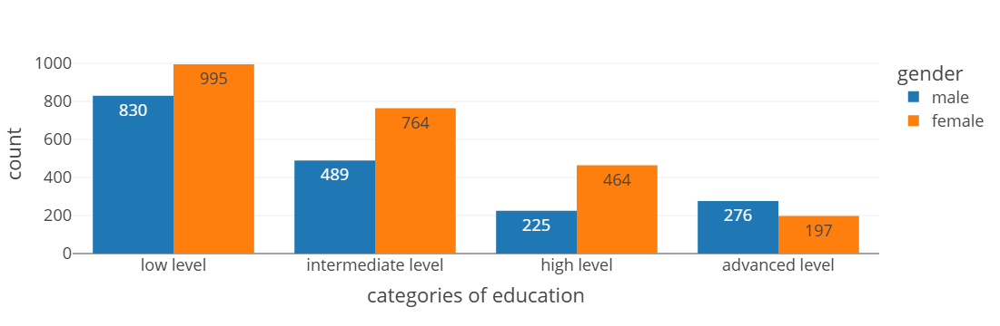

In [64]:
px.histogram(data_frame=df,x="education_cat",color="gender",template="presentation",text_auto=True,
            barmode="group",labels={"education_cat":"categories of education"}
             ,category_orders={"education_cat":["low level","intermediate level","high level","advanced level"]})

### What is the numbers of smokers according to education level

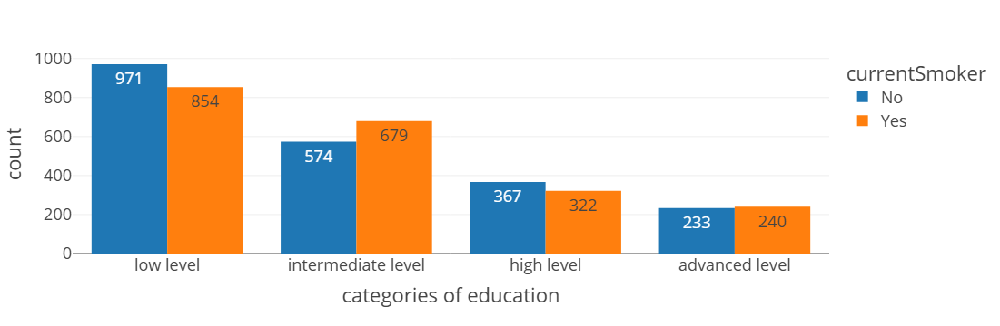

In [66]:
px.histogram(data_frame=df,x="education_cat",color="currentSmoker",template="presentation",text_auto=True,
            barmode="group",labels={"education_cat":"categories of education"}
             ,category_orders={"education_cat":["low level","intermediate level","high level","advanced level"]})

### Who smokes more, males or females in my patients

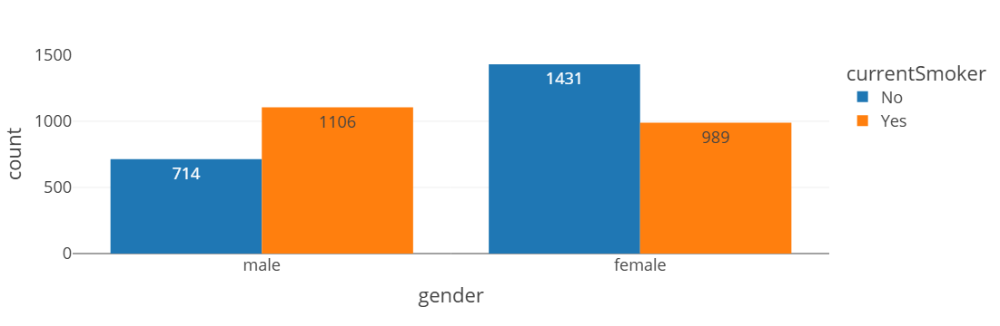

In [68]:
px.histogram(data_frame=df,x="gender",color="currentSmoker",template="presentation",text_auto=True,
            barmode="group")

* I see that number of males that smoke greater than the number of females by 117

### what is the number of cigrattes per day for each education level

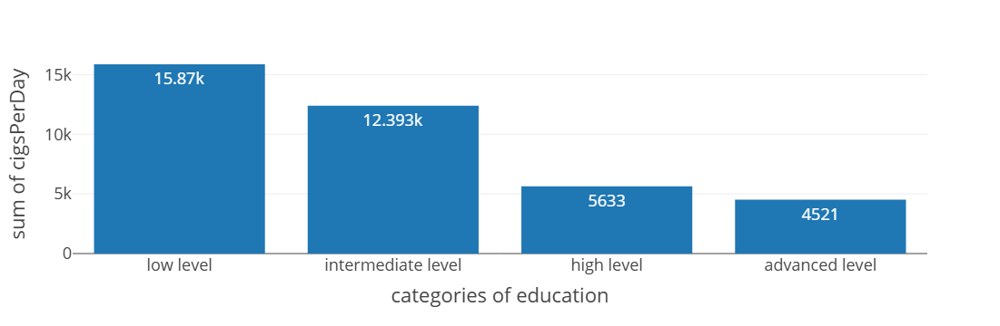

In [71]:
px.histogram(data_frame=df,x="education_cat",y="cigsPerDay",histfunc="sum",
             barmode="group",template="presentation",text_auto=True,labels={"education_cat":"categories of education"}
             ,category_orders={"education_cat":["low level","intermediate level","high level","advanced level"]})

* As you can see, individuals with a low level of education have the highest number of cigarettes per day, which is certainly predictable.

### What is the number of males and females that take blood pressure medications

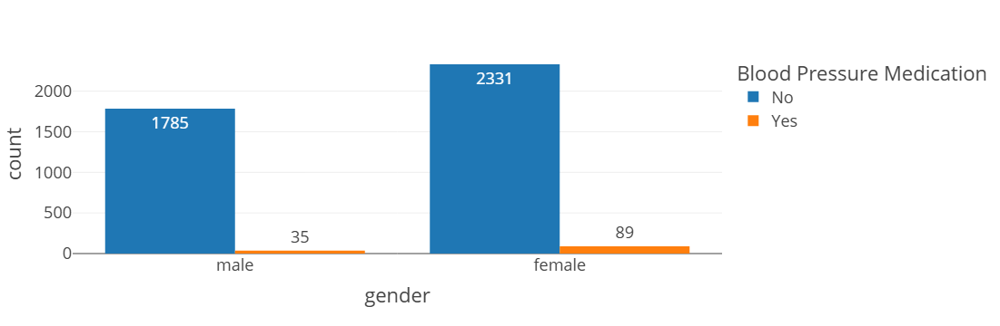

In [125]:
px.histogram(data_frame=df,x="gender",color="BPMeds",template="presentation",text_auto=True,
            barmode="group",labels={"BPMeds":"Blood Pressure Medication"})

### Are the indviduals that take blood pressure medicatons are smokers

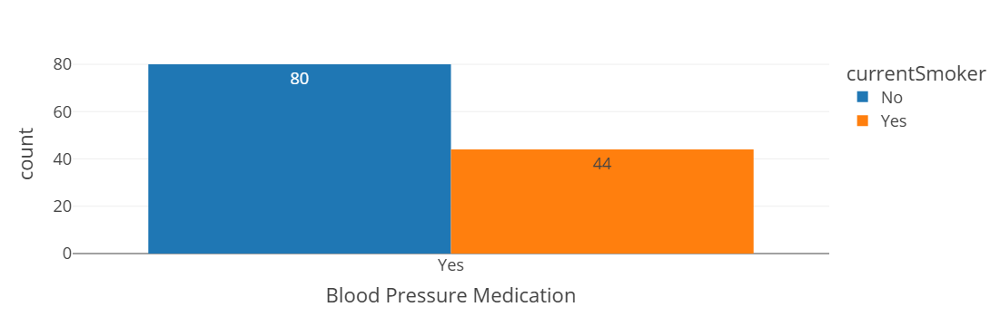

In [131]:
px.histogram(data_frame=df[df["BPMeds"]=="Yes"],x="BPMeds",color="currentSmoker",template="presentation",text_auto=True,
            barmode="group",labels={"BPMeds":"Blood Pressure Medication"})

* 44 indviduals that smoke take blood pressure medication
* 80 indviduals that not smoke don't take blood pressure medication

### Are the indviduals that have prevalent hypertension take blood pressure medication or not

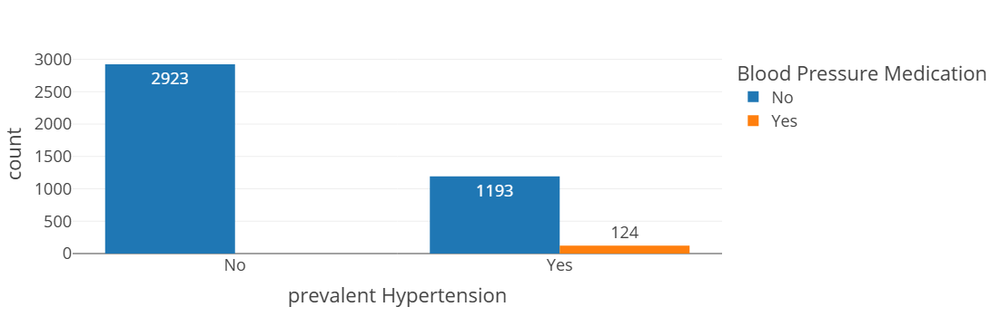

In [139]:
px.histogram(data_frame=df,x="prevalentHyp",color="BPMeds",a
            text_auto=True,template="presentation",barmode="group",
            labels={"prevalentHyp":"prevalent Hypertension","BPMeds":"Blood Pressure Medication"})

* There are 1,193 individuals with hypertension who do not take blood pressure medication, while 124 individuals do take blood pressure medication.

### What is the number of people with hypertension who have a prevalent stroke

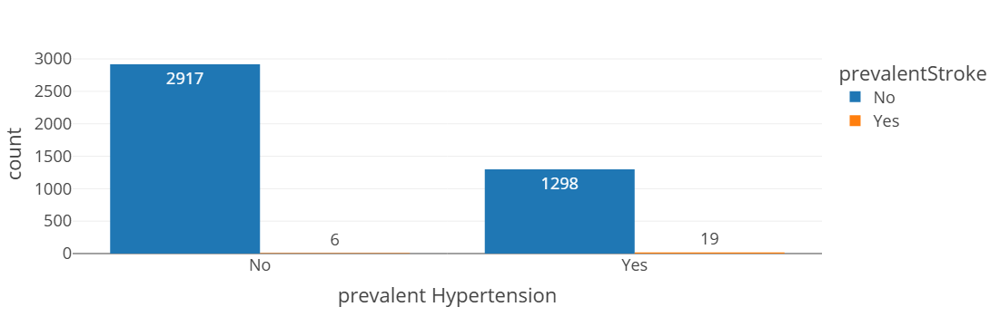

In [145]:
px.histogram(data_frame=df,x="prevalentHyp",color="prevalentStroke",
            text_auto=True,template="presentation",barmode="group",
            labels={"prevalentHyp":"prevalent Hypertension"})

* 19 indviduals that have hypertension have prevalent stroke

### What is the number of diabetic indviduals that have hypertension

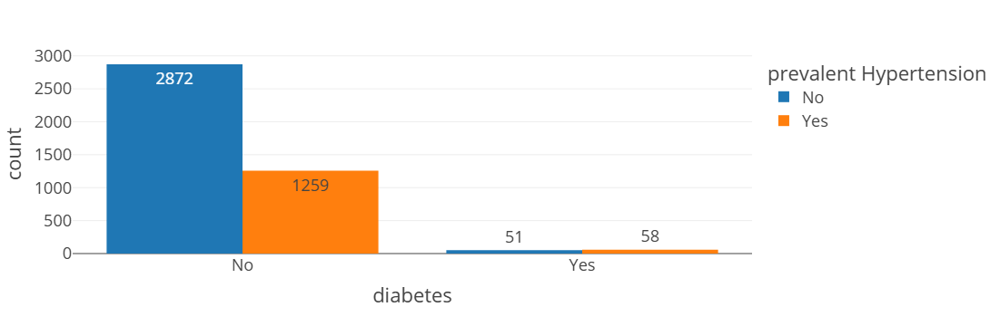

In [157]:
px.histogram(data_frame=df,x="diabetes",color="prevalentHyp",
            text_auto=True,template="presentation",barmode="group",
            labels={"prevalentHyp":"prevalent Hypertension"})

### what is state of prevalent hypertension when the age become high

In [191]:
def makeRangesForAge(age):

    if 30<=age<=40:
        return "age(30-40)"
    elif 41<=age<=50:
        return "age(41-50)"
    elif 51<=age<=60:
        return "age(51-60)"
    return "age(61-70)"


df["age_cat"]=df["age"].apply(makeRangesForAge)

df[["age","age_cat"]]

,age,age_cat
0,39.0,age(30-40)
1,46.0,age(41-50)
2,48.0,age(41-50)
3,61.0,age(61-70)
4,46.0,age(41-50)
...,...,...
4235,48.0,age(41-50)
4236,44.0,age(41-50)
4237,52.0,age(51-60)
4238,40.0,age(30-40)


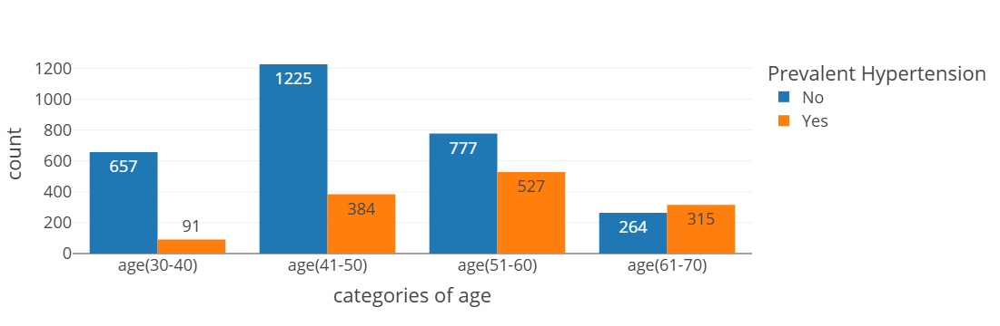

In [197]:
px.histogram(data_frame=df,x="age_cat",color="prevalentHyp",template="presentation"
            ,text_auto=True,barmode="group",labels={"age_cat":"categories of age","prevalentHyp":"Prevalent Hypertension"},
            category_orders={"age_cat":["age(30-40)","age(41-50)","age(51-60)","age(61-70)"]})

### what is number of diabetic people according to the ranges of age

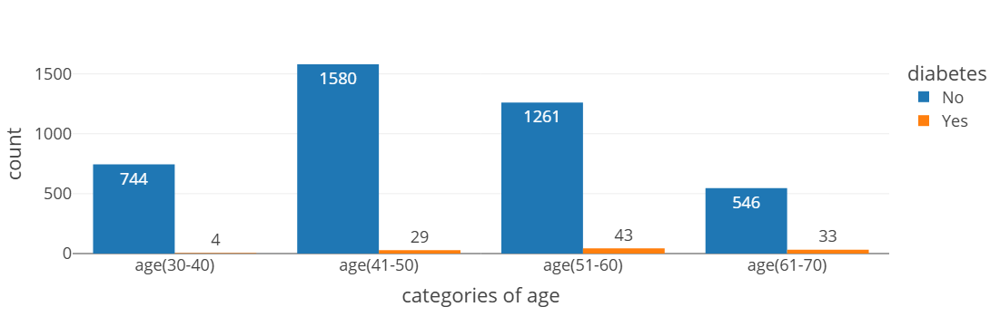

In [200]:
px.histogram(data_frame=df,x="age_cat",color="diabetes",template="presentation"
            ,text_auto=True,barmode="group",labels={"age_cat":"categories of age"},
            category_orders={"age_cat":["age(30-40)","age(41-50)","age(51-60)","age(61-70)"]})

### What is the number of males and females that have hypertension

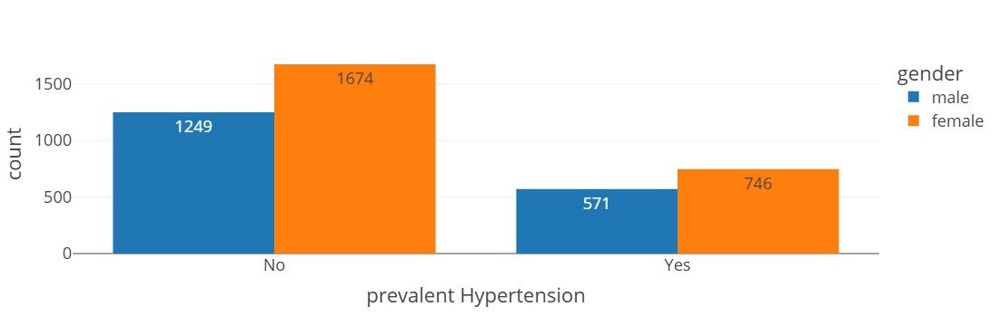

In [204]:
px.histogram(data_frame=df,x="prevalentHyp",color="gender",
            text_auto=True,template="presentation",barmode="group",
            labels={"prevalentHyp":"prevalent Hypertension"})

* the number of females that have hypertension more than the the number of males

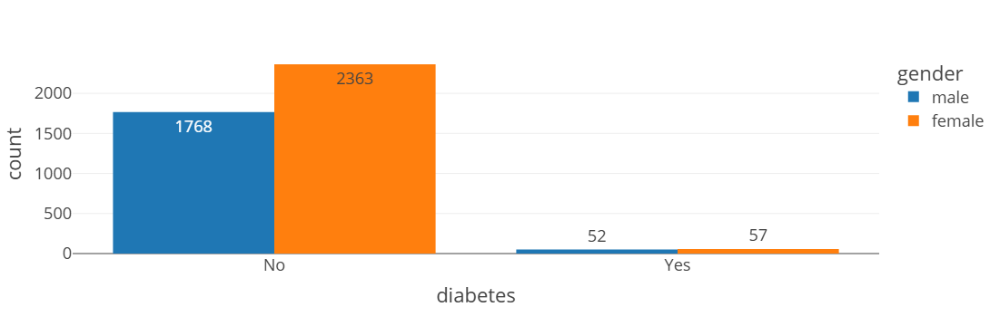

In [209]:
px.histogram(data_frame=df,x="diabetes",color="gender",
            text_auto=True,template="presentation",barmode="group")

* the number of females that have diabetes slightly more than the the number of males

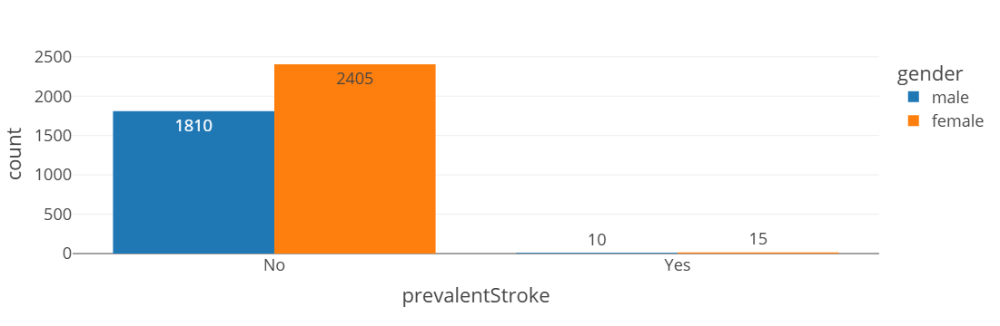

In [214]:
px.histogram(data_frame=df,x="prevalentStroke",color="gender",
            text_auto=True,template="presentation",barmode="group")

* the number of females that have stroke slightly more than the the number of males

### What is the state of cholestral when the indivduals have hypertension

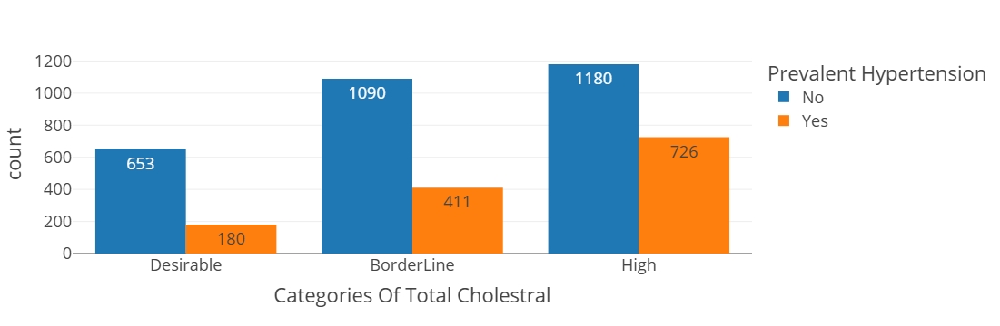

In [248]:
px.histogram(data_frame=df,x="totChol_cat",color="prevalentHyp",template="presentation",
            text_auto=True,barmode="group",labels={"totChol_cat":"Categories Of Total Cholestral","prevalentHyp":"Prevalent Hypertension"},
             category_orders={"totChol_cat":["Desirable","BorderLine","High"]})

### What is the state of cholestral when the indivduals have diabetes

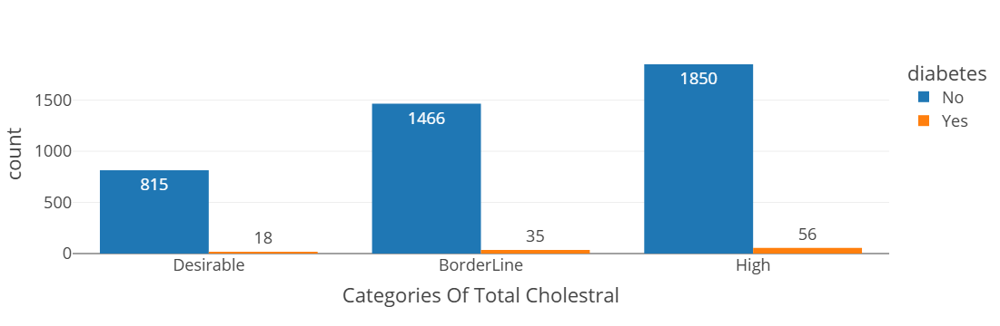

In [257]:
px.histogram(data_frame=df,x="totChol_cat",color="diabetes",template="presentation",
            text_auto=True,barmode="group",labels={"totChol_cat":"Categories Of Total Cholestral"},
             category_orders={"totChol_cat":["Desirable","BorderLine","High"]})

### Is smoking affect the total Cholestral

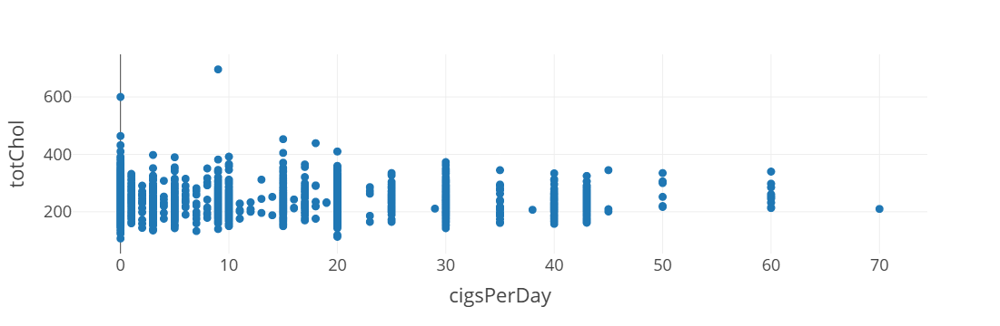

In [266]:
px.scatter(data_frame=df,x="cigsPerDay",y="totChol",template="presentation")

* I don't see a direct relation between total cholestral and smoking

### What is the states of cholestral according to the education level

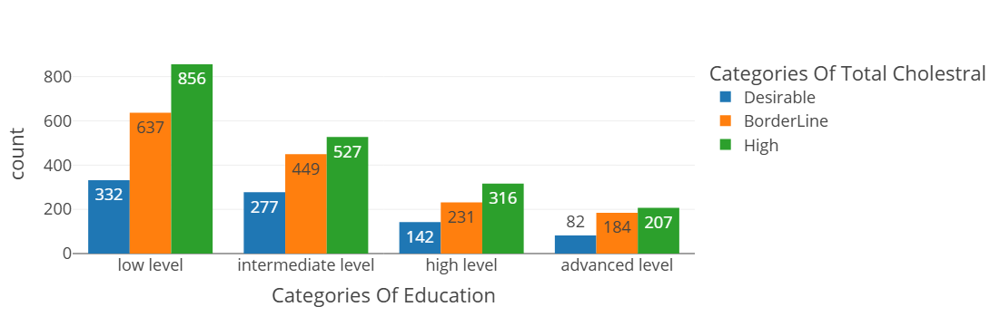

In [279]:
px.histogram(data_frame=df,x="education_cat",color="totChol_cat",template="presentation",
            text_auto=True,barmode="group",labels={"totChol_cat":"Categories Of Total Cholestral","education_cat":"Categories Of Education"},
            category_orders={"totChol_cat":["Desirable","BorderLine","High"],
                            "education_cat":["low level","intermediate level","high level","advanced level"]})

### What are the states of cholestral according to ranges of age

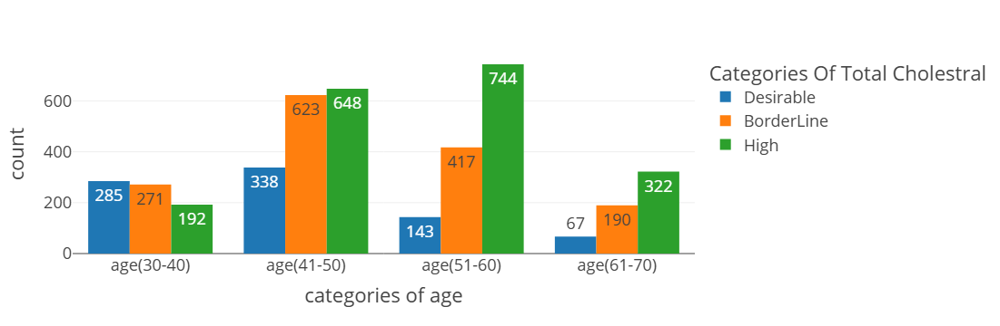

In [286]:
px.histogram(data_frame=df,x="age_cat",color="totChol_cat",template="presentation"
            ,text_auto=True,barmode="group",labels={"age_cat":"categories of age","totChol_cat":"Categories Of Total Cholestral"},
            category_orders={"age_cat":["age(30-40)","age(41-50)","age(51-60)","age(61-70)"],
                            "totChol_cat":["Desirable","BorderLine","High"]})

### what are states of blood pressure foreach education level

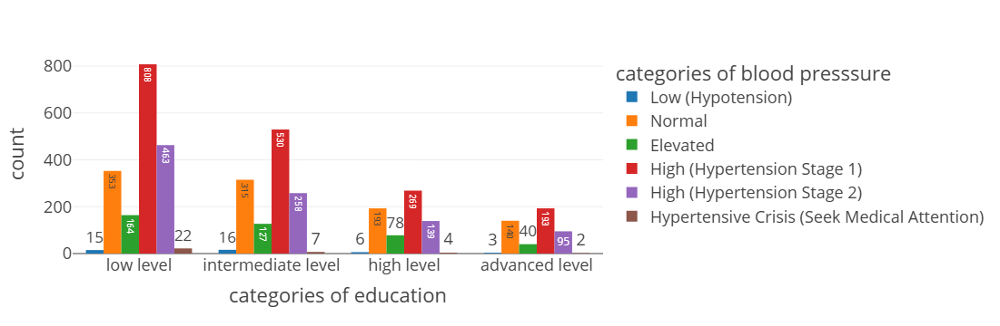

In [300]:
px.histogram(data_frame=df,x="education_cat",color="BP_Cat",
            template="presentation",text_auto=True,labels={"education_cat":"categories of education",
                                                          "BP_Cat":"categories of blood presssure"},
            category_orders={"education_cat":["low level","intermediate level","high level","advanced level"],
                        "BP_Cat":['Low (Hypotension)','Normal','Elevated','High (Hypertension Stage 1)',
                                 'High (Hypertension Stage 2)','Hypertensive Crisis (Seek Medical Attention)']},
            barmode="group")

### What is the stages of blood pressure according to smokers

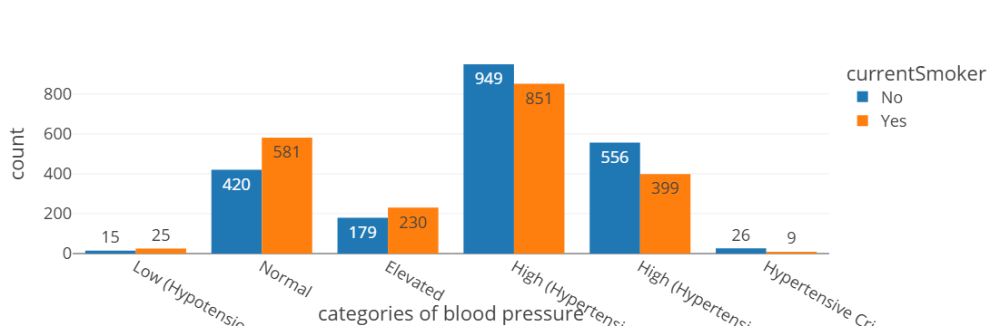

In [308]:
px.histogram(data_frame=df,x="BP_Cat",color="currentSmoker",
            template="presentation",text_auto=True,barmode="group",
            labels={"BP_Cat":"categories of blood pressure"},
             category_orders={"BP_Cat":['Low (Hypotension)','Normal','Elevated','High (Hypertension Stage 1)',
                                 'High (Hypertension Stage 2)','Hypertensive Crisis (Seek Medical Attention)']})

### What is the stages of blood pressure according to diabetic people

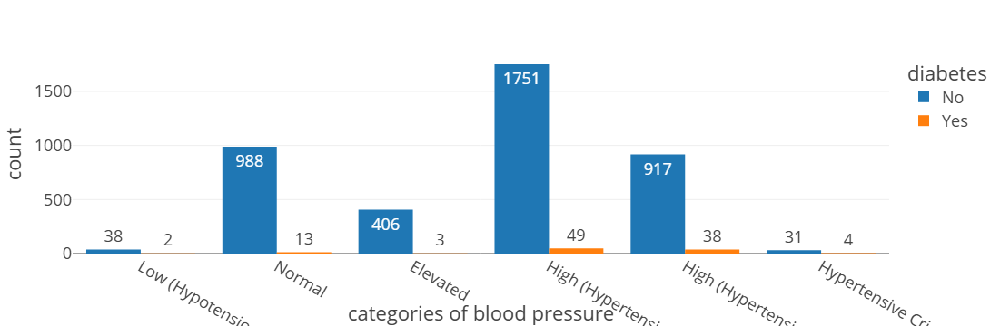

In [311]:
px.histogram(data_frame=df,x="BP_Cat",color="diabetes",
            template="presentation",text_auto=True,barmode="group",
            labels={"BP_Cat":"categories of blood pressure"},
             category_orders={"BP_Cat":['Low (Hypotension)','Normal','Elevated','High (Hypertension Stage 1)',
                                 'High (Hypertension Stage 2)','Hypertensive Crisis (Seek Medical Attention)']})

### What is the stages of blood pressure according to cholestral

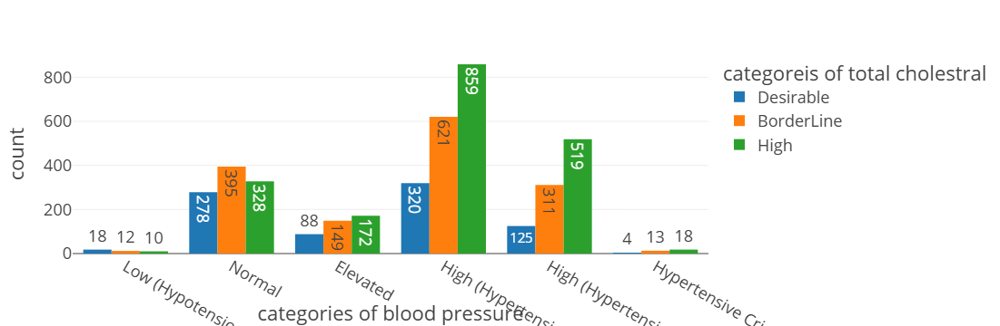

In [320]:
px.histogram(data_frame=df,x="BP_Cat",color="totChol_cat",
            template="presentation",text_auto=True,barmode="group",
            labels={"BP_Cat":"categories of blood pressure",
                   "totChol_cat":"categoreis of total cholestral"},
             category_orders={"BP_Cat":['Low (Hypotension)','Normal','Elevated','High (Hypertension Stage 1)',
                                 'High (Hypertension Stage 2)','Hypertensive Crisis (Seek Medical Attention)'],
                             "totChol_cat":["Desirable","BorderLine","High"]})

### What is the number of people that take blood pressure medication in every state of blood pressure

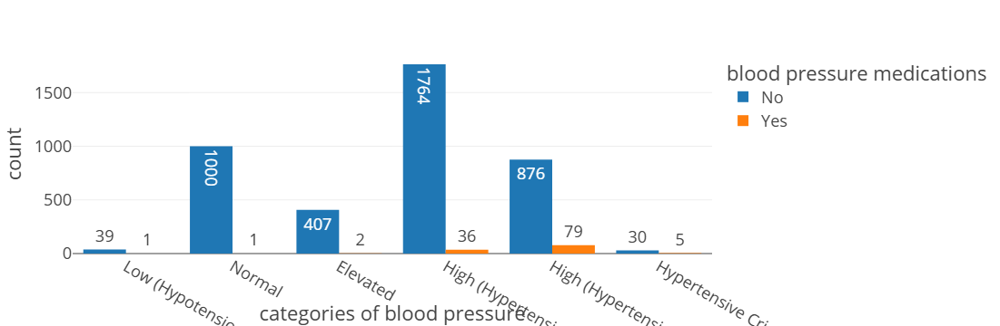

In [329]:
px.histogram(data_frame=df,x="BP_Cat",color="BPMeds",
            template="presentation",text_auto=True,barmode="group",
            labels={"BP_Cat":"categories of blood pressure","BPMeds":"blood pressure medications"},
             category_orders={"BP_Cat":['Low (Hypotension)','Normal','Elevated','High (Hypertension Stage 1)',
                                 'High (Hypertension Stage 2)','Hypertensive Crisis (Seek Medical Attention)']})

### is the diabetic people have high BMI

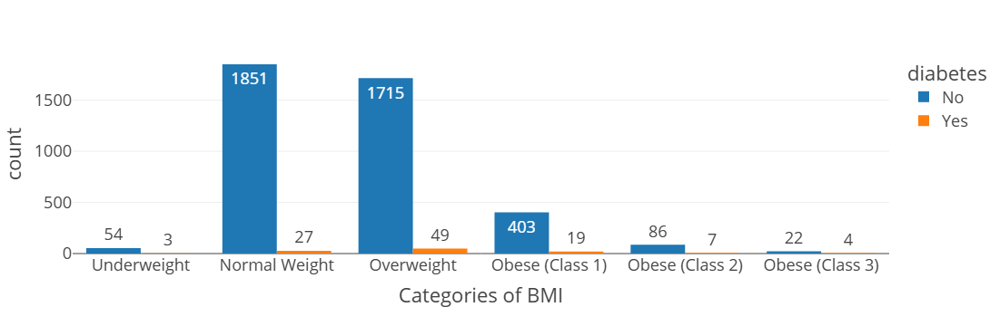

In [341]:
px.histogram(data_frame=df,x="BMI_cat",color="diabetes",
            template="presentation",text_auto=True,barmode="group",labels={"BMI_cat":"Categories of BMI"},
            category_orders={"BMI_cat":['Underweight','Normal Weight','Overweight','Obese (Class 1)','Obese (Class 2)','Obese (Class 3)']})

### people that has hypertension has high bmi or not

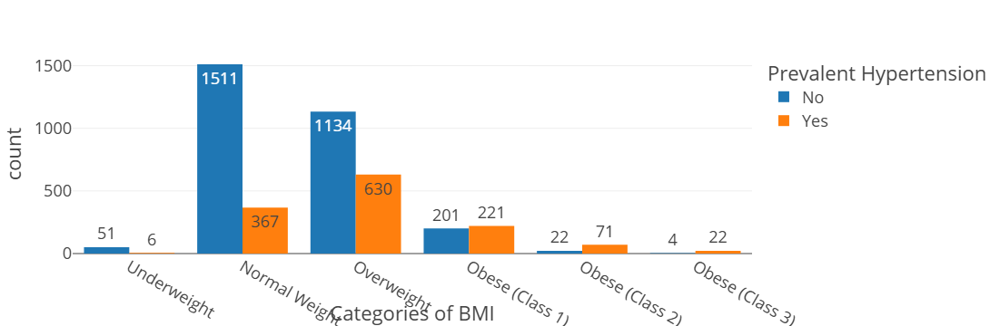

In [345]:
px.histogram(data_frame=df,x="BMI_cat",color="prevalentHyp",
            template="presentation",text_auto=True,barmode="group",labels={"BMI_cat":"Categories of BMI",
                                                                          "prevalentHyp":"Prevalent Hypertension"},
            category_orders={"BMI_cat":['Underweight','Normal Weight','Overweight','Obese (Class 1)','Obese (Class 2)','Obese (Class 3)']})

### people tht has a cholestral has high bmi or not

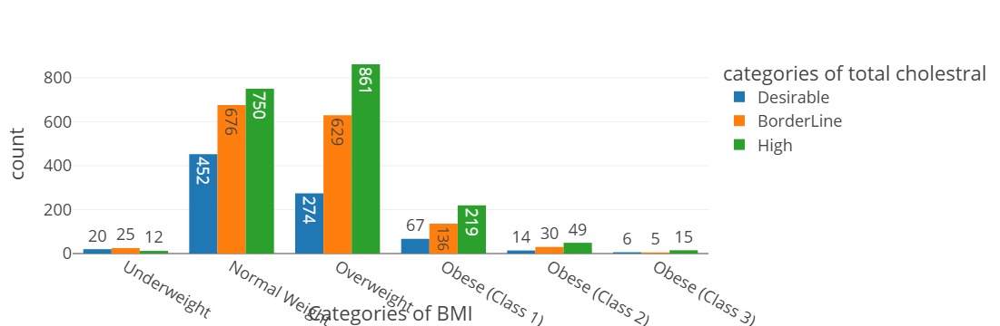

In [350]:
px.histogram(data_frame=df,x="BMI_cat",color="totChol_cat",
            template="presentation",text_auto=True,barmode="group",labels={"BMI_cat":"Categories of BMI",
                                                                          "totChol_cat":"categories of total cholestral"},
            category_orders={"BMI_cat":['Underweight','Normal Weight','Overweight','Obese (Class 1)','Obese (Class 2)','Obese (Class 3)'],
                            "totChol_cat":["Desirable","BorderLine","High"]})

* I see a strong relation between BMI and Cholestral

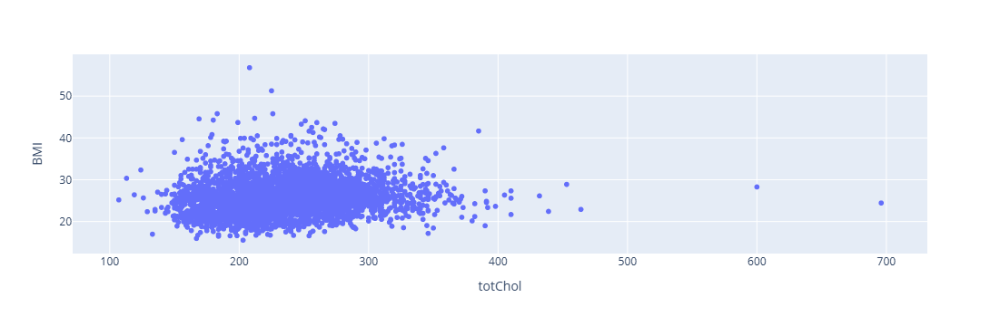

In [355]:
px.scatter(data_frame=df,x="totChol",y="BMI")

* A direct relation between between cholestral and bmi
  

### High BMI affect blood pressure yes or not

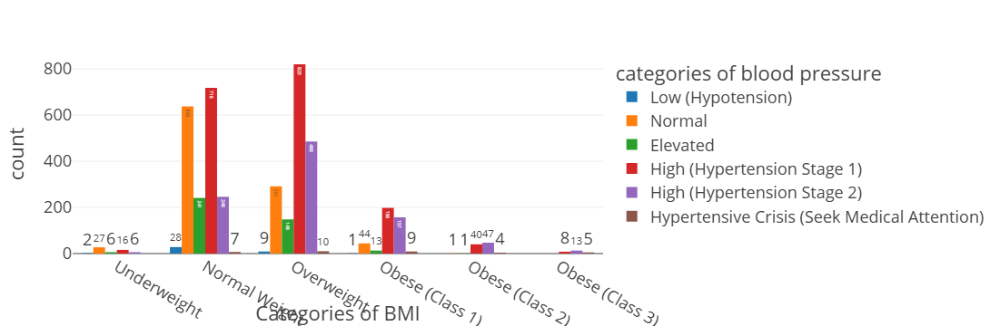

In [359]:
px.histogram(data_frame=df,x="BMI_cat",color="BP_Cat",
            template="presentation",text_auto=True,barmode="group",
            labels={"BP_Cat":"categories of blood pressure","BMI_cat":"Categories of BMI"},
             category_orders={"BP_Cat":['Low (Hypotension)','Normal','Elevated','High (Hypertension Stage 1)',
                                 'High (Hypertension Stage 2)','Hypertensive Crisis (Seek Medical Attention)'],
                            "BMI_cat":['Underweight','Normal Weight','Overweight','Obese (Class 1)','Obese (Class 2)','Obese (Class 3)'] })

### What is the states of BMI foreach education level

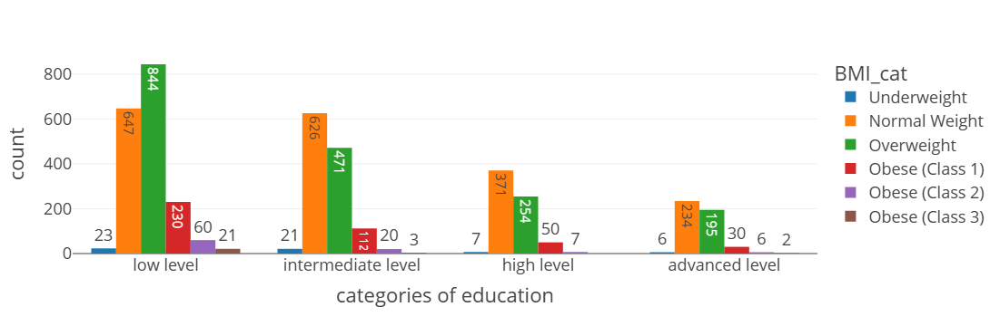

In [364]:
px.histogram(data_frame=df,x="education_cat",color="BMI_cat",
            template="presentation",text_auto=True,labels={"education_cat":"categories of education",
                                                          "BMI":"categories BMI"},
            category_orders={"education_cat":["low level","intermediate level","high level","advanced level"],
                       "BMI_cat":['Underweight','Normal Weight','Overweight','Obese (Class 1)','Obese (Class 2)','Obese (Class 3)']  },
            barmode="group")

### Can being overweight cause prevalent stroke

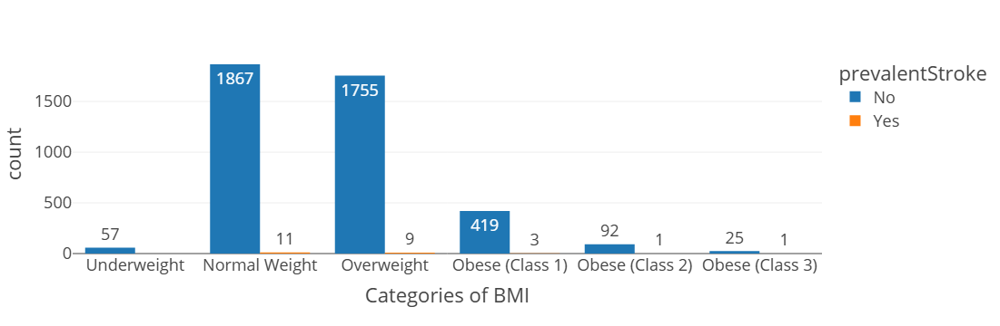

In [367]:
px.histogram(data_frame=df,x="BMI_cat",color="prevalentStroke",
            template="presentation",text_auto=True,barmode="group",labels={"BMI_cat":"Categories of BMI"},
            category_orders={"BMI_cat":['Underweight','Normal Weight','Overweight','Obese (Class 1)','Obese (Class 2)','Obese (Class 3)']})

### Can being overweight cause high heart rate

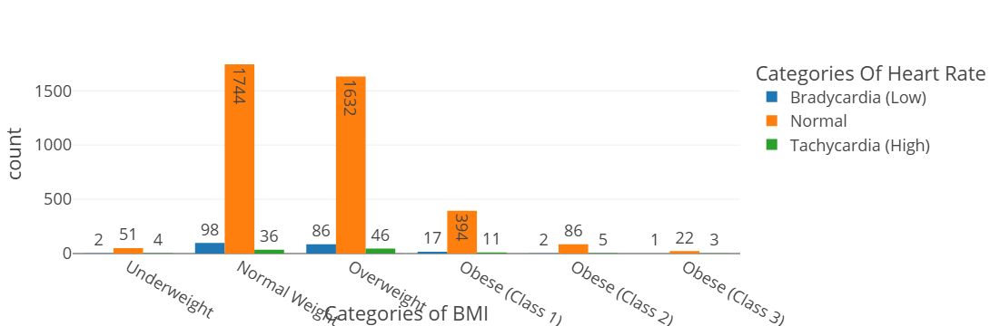

In [373]:
px.histogram(data_frame=df,x="BMI_cat",color="heartRate_cat",
            template="presentation",text_auto=True,barmode="group",labels={"BMI_cat":"Categories of BMI",
                                                                          "heartRate_cat":"Categories Of Heart Rate"},
            category_orders={"BMI_cat":['Underweight','Normal Weight','Overweight','Obese (Class 1)','Obese (Class 2)','Obese (Class 3)'],
                            "heartRate_cat":["Bradycardia (Low)","Normal","Tachycardia (High)"]})

* I see that the highest normal heart rate in the normal weight state

### is a relation between higher heart rate and educaton level

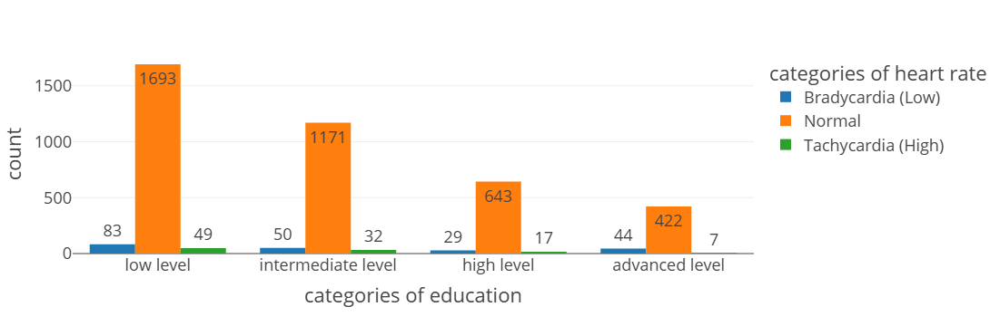

In [377]:
px.histogram(data_frame=df,x="education_cat",color="heartRate_cat",
            template="presentation",text_auto=True,labels={"education_cat":"categories of education",
                                                          "heartRate_cat":"categories of heart rate"},
            category_orders={"education_cat":["low level","intermediate level","high level","advanced level"],
                        "heartRate_cat":["Bradycardia (Low)","Normal","Tachycardia (High)"] },
            barmode="group")

### higher heart rate can cause hypertension

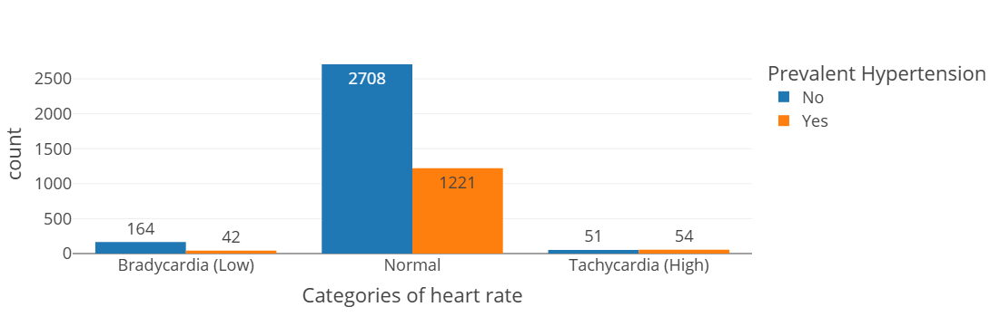

In [380]:
px.histogram(data_frame=df,x="heartRate_cat",color="prevalentHyp",
            template="presentation",text_auto=True,barmode="group",labels={"heartRate_cat":"Categories of heart rate",
                                                                          "prevalentHyp":"Prevalent Hypertension"},
            category_orders={"heartRate_cat":["Bradycardia (Low)","Normal","Tachycardia (High)"] })

### high heart rate cause high cholestral or not

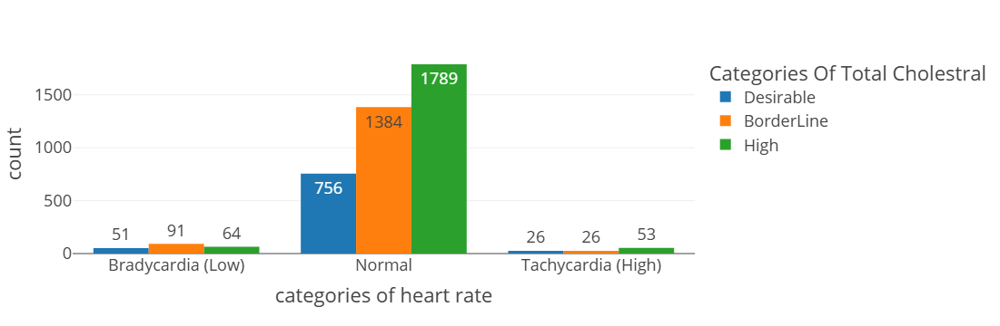

In [383]:
px.histogram(data_frame=df,x="heartRate_cat",color="totChol_cat",template="presentation",
            text_auto=True,barmode="group",labels={"totChol_cat":"Categories Of Total Cholestral","heartRate_cat":"categories of heart rate"},
            category_orders={"totChol_cat":["Desirable","BorderLine","High"],
                            "heartRate_cat":["Bradycardia (Low)","Normal","Tachycardia (High)"]})

### Does smoking affect heart rate

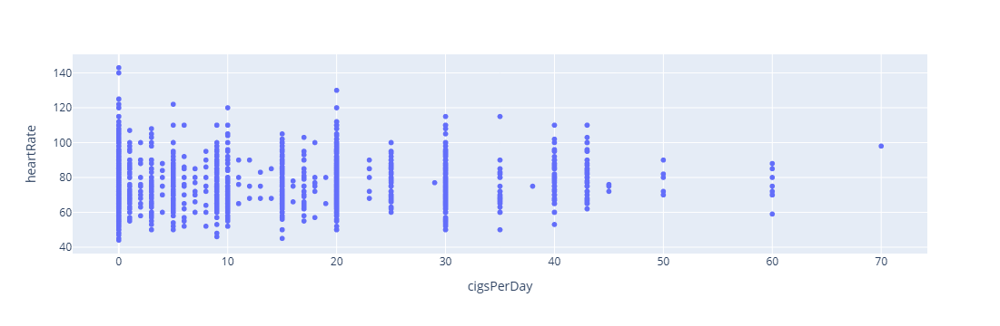

In [388]:
px.scatter(data_frame=df,y="heartRate",x="cigsPerDay")

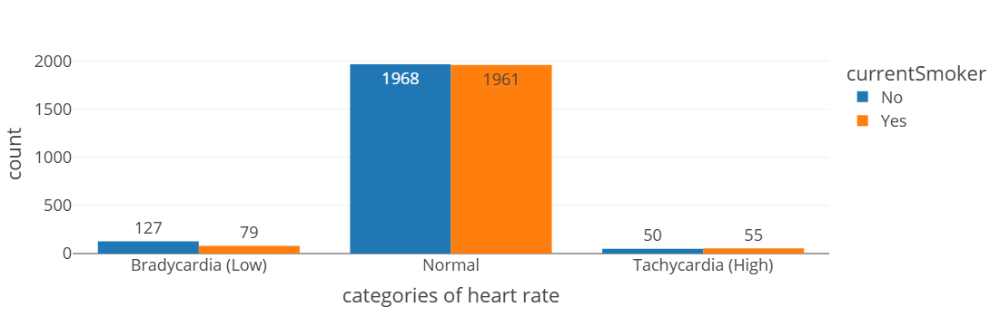

In [393]:
px.histogram(data_frame=df,x="heartRate_cat",color="currentSmoker",template="presentation",
            text_auto=True,barmode="group",labels={"heartRate_cat":"categories of heart rate"},
            category_orders={
                            "heartRate_cat":["Bradycardia (Low)","Normal","Tachycardia (High)"]})

### is the age affect heart rate

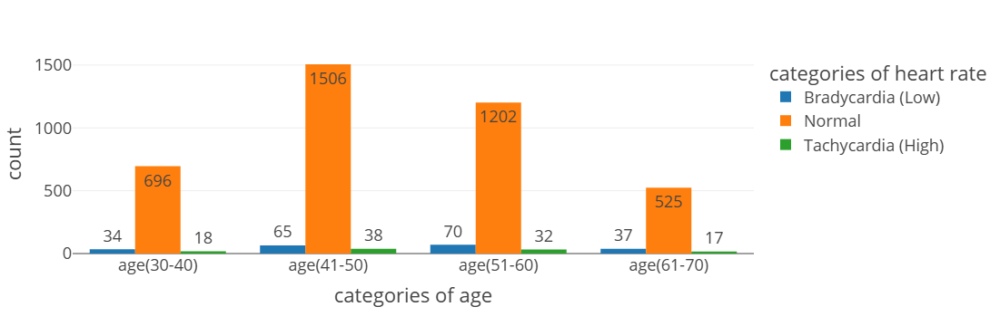

In [396]:
px.histogram(data_frame=df,x="age_cat",color="heartRate_cat",template="presentation"
            ,text_auto=True,barmode="group",labels={"age_cat":"categories of age","heartRate_cat":"categories of heart rate"},
            category_orders={"age_cat":["age(30-40)","age(41-50)","age(51-60)","age(61-70)"],
                           "heartRate_cat":["Bradycardia (Low)","Normal","Tachycardia (High)"] })

### is heart rate afffect blood pressure

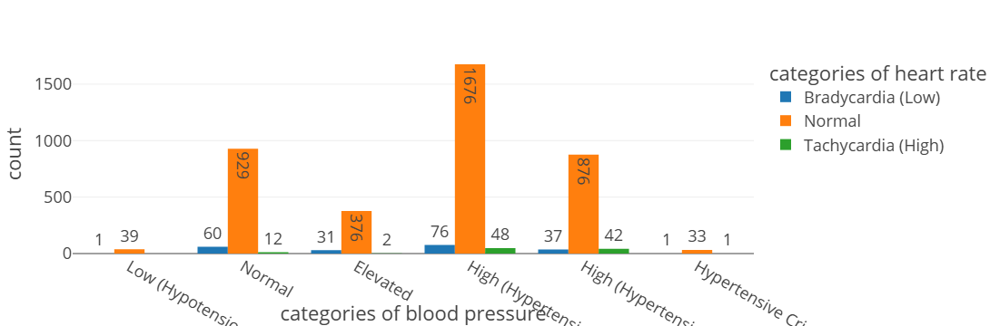

In [399]:
px.histogram(data_frame=df,x="BP_Cat",color="heartRate_cat",
            template="presentation",text_auto=True,barmode="group",
            labels={"BP_Cat":"categories of blood pressure","heartRate_cat":"categories of heart rate"},
             category_orders={"BP_Cat":['Low (Hypotension)','Normal','Elevated','High (Hypertension Stage 1)',
                                 'High (Hypertension Stage 2)','Hypertensive Crisis (Seek Medical Attention)'],
                             "heartRate_cat":["Bradycardia (Low)","Normal","Tachycardia (High)"]})

### What is the number of males and female that get infected by coronary heart disease in the coming ten years

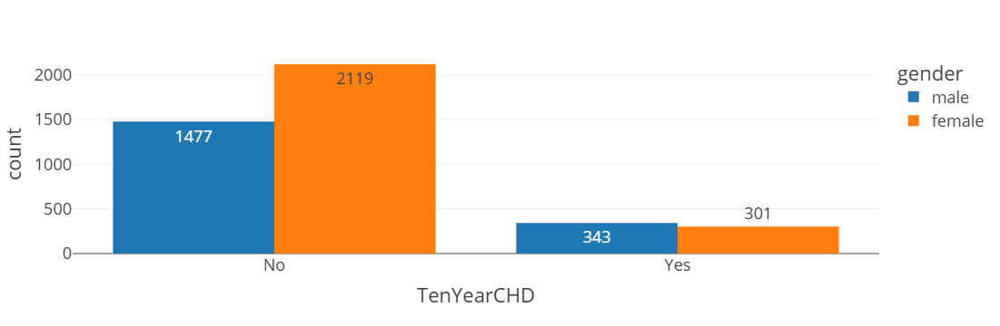

In [421]:
px.histogram(data_frame=df,x="TenYearCHD",color="gender",template="presentation",
          
             text_auto=True,barmode="group")

* the number of males that be infected by coronary heart disease more than the number of females

### is a age can be a factor that affect coronary heart disease

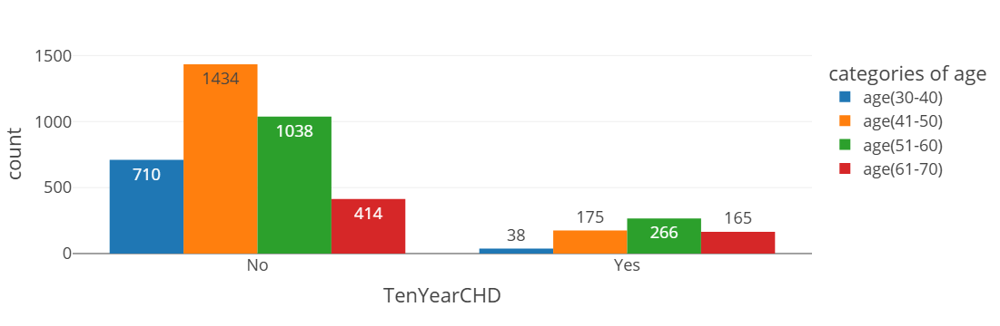

In [430]:
px.histogram(data_frame=df,x="TenYearCHD",color="age_cat",template="presentation"
            ,text_auto=True,barmode="group",labels={"age_cat":"categories of age"},
            category_orders={"age_cat":["age(30-40)","age(41-50)","age(51-60)","age(61-70)"]})

### Does a low level of education have the highest number of individuals who are more prone to coronary heart disease

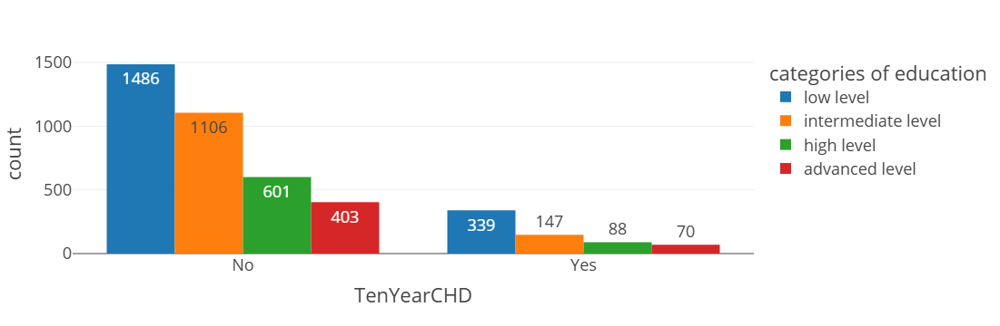

In [433]:
px.histogram(data_frame=df,x="TenYearCHD",color="education_cat",
            template="presentation",text_auto=True,labels={"education_cat":"categories of education"},
            category_orders={"education_cat":["low level","intermediate level","high level","advanced level"]},
            barmode="group")

### is smoking affect coronay heart disease

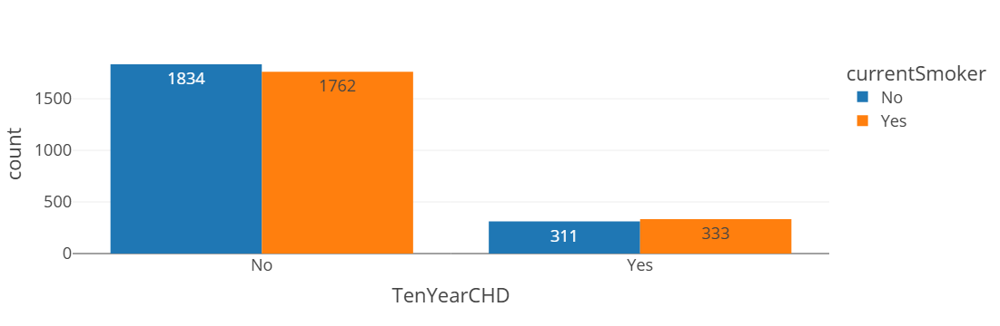

In [436]:
px.histogram(data_frame=df,x="TenYearCHD",color="currentSmoker",
            template="presentation",text_auto=True,
            barmode="group")

### Are people who take blood pressure medication more prone to the risk of coronary heart disease

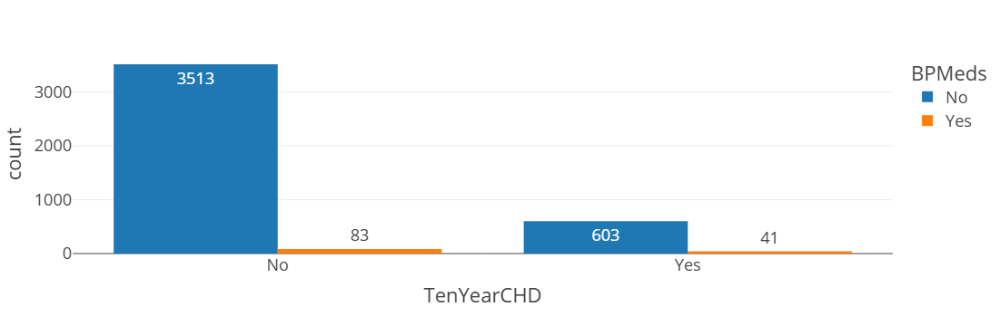

In [443]:
px.histogram(data_frame=df,x="TenYearCHD",color="BPMeds",
            template="presentation",text_auto=True,
            barmode="group")

### Are People that have prevalent stroke are more prone to the risk of coronary heart disease

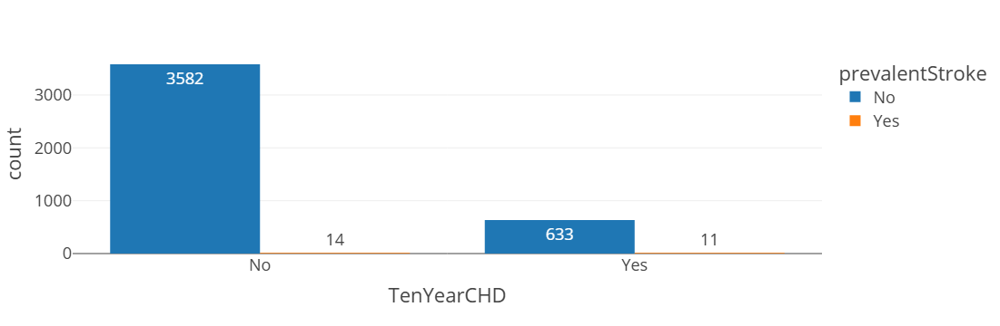

In [446]:
px.histogram(data_frame=df,x="TenYearCHD",color="prevalentStroke",
            template="presentation",text_auto=True,
            barmode="group")

### Are People that have prevalent hypertension are more prone to the risk of coronary heart disease

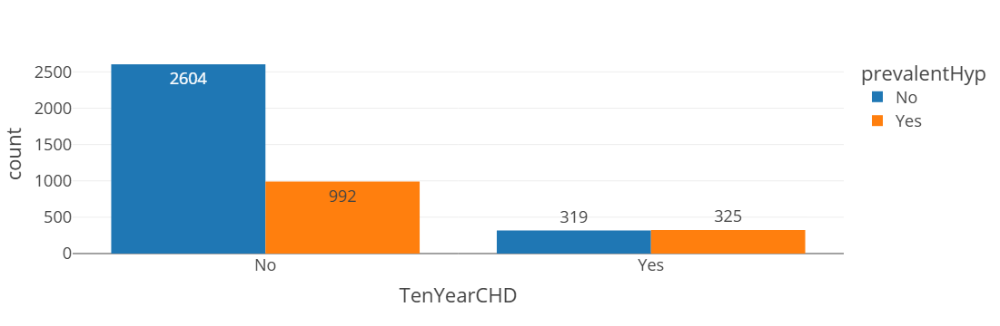

In [449]:
px.histogram(data_frame=df,x="TenYearCHD",color="prevalentHyp",
            template="presentation",text_auto=True,
            barmode="group")

### Are People that have diabetes are more prone to the risk of coronary heart disease

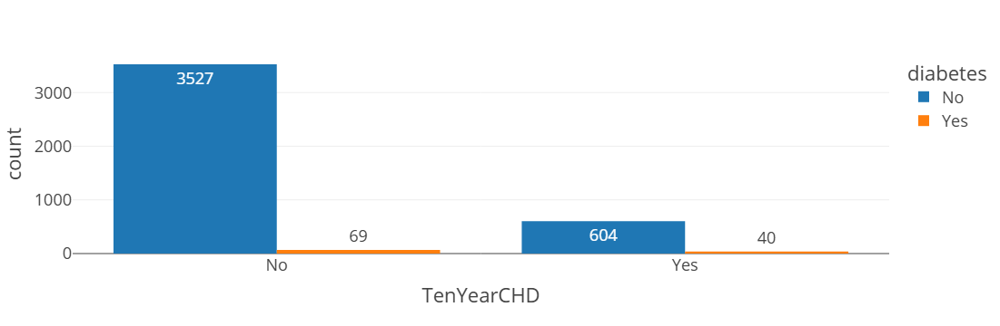

In [452]:
px.histogram(data_frame=df,x="TenYearCHD",color="diabetes",
            template="presentation",text_auto=True,
            barmode="group")

### high cholestral can be factor or reason for coronaary heart disease risk

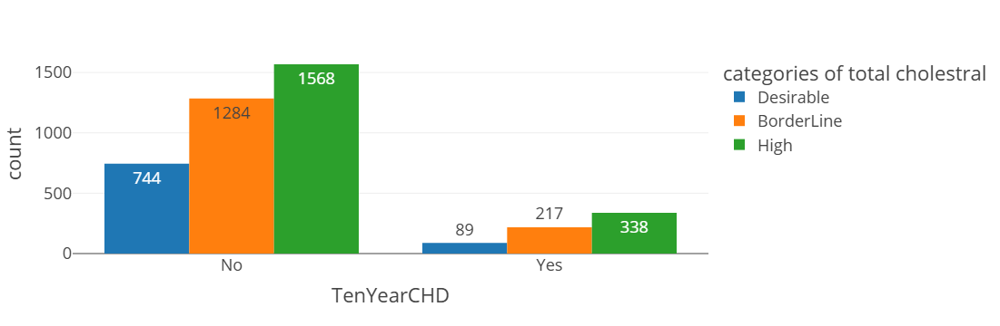

In [457]:
px.histogram(data_frame=df,x='TenYearCHD',color="totChol_cat",
            template="presentation",text_auto=True,labels={"totChol_cat":"categories of total cholestral"},
            category_orders={"totChol_cat":['Desirable',"BorderLine","High"]},barmode="group")

### is blood pressure affect coronary heart disease 

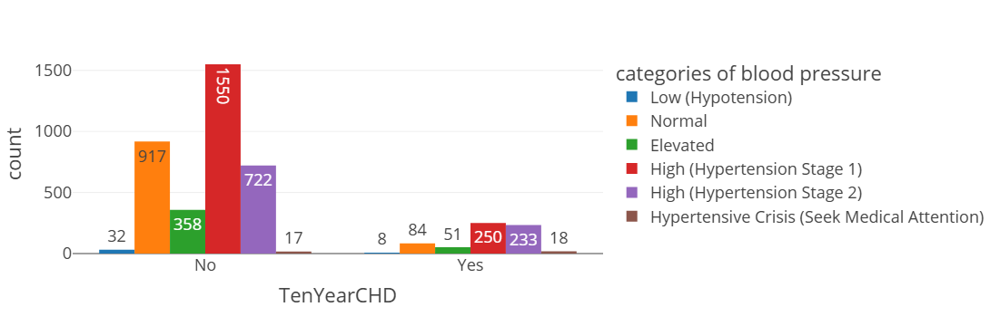

In [461]:
px.histogram(data_frame=df,x="TenYearCHD",color="BP_Cat",
            template="presentation",text_auto=True,barmode="group",
            labels={"BP_Cat":"categories of blood pressure","heartRate_cat":"categories of heart rate"},
             category_orders={"BP_Cat":['Low (Hypotension)','Normal','Elevated','High (Hypertension Stage 1)',
                                 'High (Hypertension Stage 2)','Hypertensive Crisis (Seek Medical Attention)']})

### is overweight can be cause of coronary heart disease risk

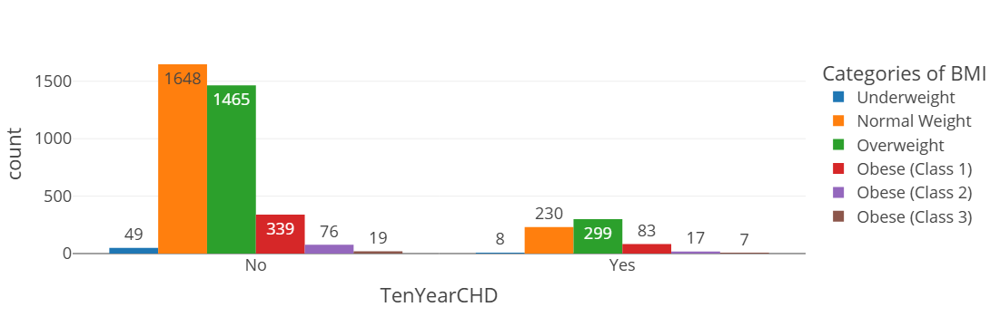

In [468]:
px.histogram(data_frame=df,x="TenYearCHD",color="BMI_cat",
            template="presentation",text_auto=True,barmode="group",labels={"BMI_cat":"Categories of BMI"},
            category_orders={"BMI_cat":['Underweight','Normal Weight','Overweight','Obese (Class 1)','Obese (Class 2)','Obese (Class 3)']})

### Can heart conditions be a cause of coronary heart disease risk

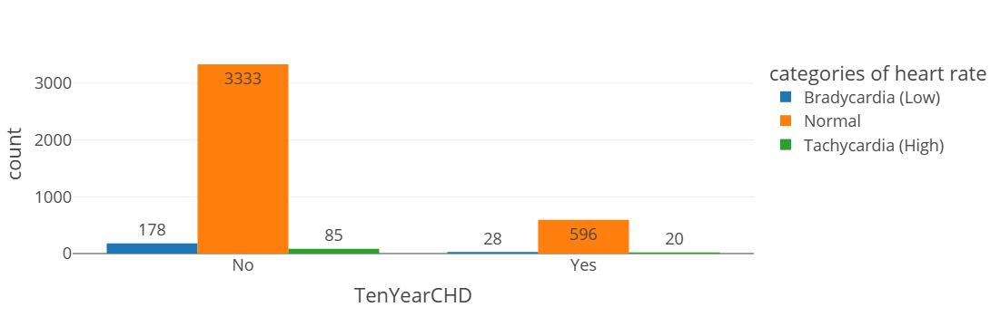

In [471]:
px.histogram(data_frame=df,x="TenYearCHD",color="heartRate_cat",
            template="presentation",text_auto=True,barmode="group",
            labels={"heartRate_cat":"categories of heart rate"},
             category_orders={
                             "heartRate_cat":["Bradycardia (Low)","Normal","Tachycardia (High)"]})

### High glucose can affect coronary heart 

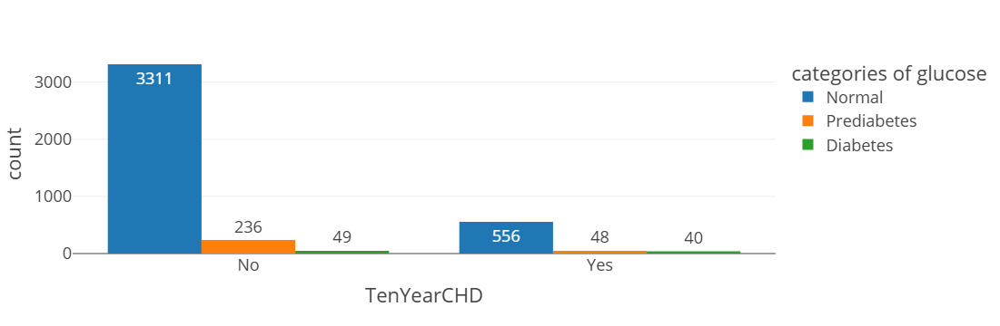

In [479]:
px.histogram(data_frame=df,x="TenYearCHD",color="glucose_cat",
            template="presentation",text_auto=True,barmode="group",labels={"glucose_cat":"categories of glucose"},
            category_orders={"glucose_cat":["Normal","Prediabetes","Diabetes"]})

### check relations

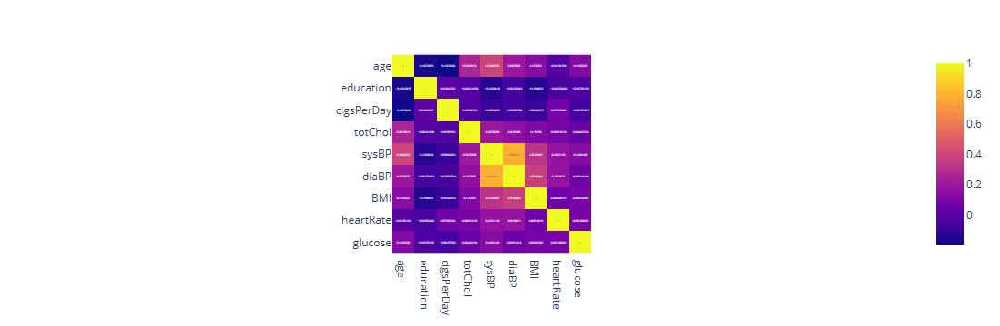

In [487]:
corr=df.select_dtypes("number").corr()
px.imshow(corr,text_auto=True)

### convert dataframe to csv file

In [498]:
df.to_csv(r"H:\Coronary_Heart_Disease_Future_Analysis\Predict-CHD.csv",index=False)
print("data is converted")

data is converted


### highest cigrattes per day and how it is affected

In [39]:


display(df[((df["cigsPerDay"] == 60) | (df["cigsPerDay"] == 70))] )


,gender,age,age_cat,education,education_cat,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,totChol_cat,sysBP,diaBP,BP_Cat,BMI,BMI_cat,heartRate,heartRate_cat,glucose,glucose_cat,TenYearCHD
327,male,56,age(51-60),1,low level,Yes,60,No,No,No,No,246.0,High,125.0,79.0,Elevated,29.64,Overweight,70.0,Normal,85.000000,Normal,No
721,male,59,age(51-60),1,low level,Yes,60,No,No,Yes,No,298.0,High,153.5,105.0,High (Hypertension Stage 2),25.05,Overweight,70.0,Normal,84.000000,Normal,No
1054,male,58,age(51-60),2,intermediate level,Yes,60,No,No,Yes,No,250.0,High,150.0,97.0,High (Hypertension Stage 2),32.00,Obese (Class 1),75.0,Normal,65.000000,Normal,No
1452,male,39,age(30-40),1,low level,Yes,60,No,No,No,No,215.0,BorderLine,112.0,65.0,Normal,23.60,Normal Weight,59.0,Bradycardia (Low),78.000000,Normal,No
1468,male,50,age(41-50),1,low level,Yes,60,No,No,Yes,No,340.0,High,134.0,95.0,High (Hypertension Stage 1),30.46,Obese (Class 1),85.0,Normal,86.000000,Normal,No
1488,male,37,age(30-40),4,advanced level,Yes,60,No,No,No,No,254.0,High,122.5,82.5,High (Hypertension Stage 1),23.87,Normal Weight,88.0,Normal,83.000000,Normal,No
1849,male,48,age(41-50),1,low level,Yes,60,No,No,No,No,252.0,High,104.0,73.5,Normal,23.03,Normal Weight,70.0,Normal,77.000000,Normal,No
2709,male,46,age(41-50),1,low level,Yes,60,No,No,No,No,285.0,High,121.0,82.0,High (Hypertension Stage 1),27.62,Overweight,70.0,Normal,79.000000,Normal,No
2710,male,49,age(41-50),2,intermediate level,Yes,60,No,No,No,No,213.0,BorderLine,123.0,75.0,Elevated,24.84,Normal Weight,70.0,Normal,73.333333,Normal,Yes
3008,male,40,age(30-40),3,high level,Yes,70,No,No,Yes,No,210.0,BorderLine,132.0,86.0,High (Hypertension Stage 1),31.57,Obese (Class 1),98.0,Normal,80.000000,Normal,No


### CHD And Cholestral

In [42]:
df[(df["totChol"]>248.5)]

,gender,age,age_cat,education,education_cat,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,totChol_cat,sysBP,diaBP,BP_Cat,BMI,BMI_cat,heartRate,heartRate_cat,glucose,glucose_cat,TenYearCHD
1,female,46,age(41-50),2,intermediate level,No,0,No,No,No,No,250.0,High,121.0,81.0,High (Hypertension Stage 1),28.73,Overweight,95.0,Normal,76.000000,Normal,No
4,female,46,age(41-50),3,high level,Yes,23,No,No,No,No,285.0,High,130.0,84.0,High (Hypertension Stage 1),23.10,Normal Weight,85.0,Normal,85.000000,Normal,No
7,female,45,age(41-50),2,intermediate level,Yes,20,No,No,No,No,313.0,High,100.0,71.0,Normal,21.68,Normal Weight,79.0,Normal,78.000000,Normal,No
8,male,52,age(51-60),1,low level,No,0,No,No,Yes,No,260.0,High,141.5,89.0,High (Hypertension Stage 1),26.36,Overweight,76.0,Normal,79.000000,Normal,No
10,female,50,age(41-50),1,low level,No,0,No,No,No,No,254.0,High,133.0,76.0,High (Hypertension Stage 1),22.91,Normal Weight,75.0,Normal,76.000000,Normal,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4228,female,50,age(41-50),1,low level,No,0,No,No,Yes,Yes,260.0,High,190.0,130.0,Hypertensive Crisis (Seek Medical Attention),43.67,Obese (Class 3),85.0,Normal,260.000000,Diabetes,No
4229,female,51,age(51-60),3,high level,Yes,20,No,No,Yes,No,251.0,High,140.0,80.0,High (Hypertension Stage 1),25.60,Overweight,75.0,Normal,84.000000,Normal,No
4230,female,56,age(51-60),1,low level,Yes,3,No,No,Yes,No,268.0,High,170.0,102.0,High (Hypertension Stage 2),22.89,Normal Weight,57.0,Bradycardia (Low),76.333333,Normal,No
4233,male,50,age(41-50),1,low level,Yes,1,No,No,Yes,No,313.0,High,179.0,92.0,High (Hypertension Stage 2),25.97,Overweight,66.0,Normal,86.000000,Normal,Yes


In [44]:
df[(df["totChol"]>248.5)&(df["TenYearCHD"]=="Yes")]

,gender,age,age_cat,education,education_cat,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,totChol_cat,sysBP,diaBP,BP_Cat,BMI,BMI_cat,heartRate,heartRate_cat,glucose,glucose_cat,TenYearCHD
17,female,46,age(41-50),2,intermediate level,Yes,20,No,No,No,No,291.0,High,112.0,78.0,Normal,23.38,Normal Weight,80.0,Normal,89.0,Normal,Yes
25,male,47,age(41-50),4,advanced level,Yes,20,No,No,No,No,294.0,High,102.0,68.0,Normal,24.18,Normal Weight,62.0,Normal,66.0,Normal,Yes
28,female,61,age(61-70),3,high level,No,0,No,No,Yes,No,272.0,High,182.0,121.0,Hypertensive Crisis (Seek Medical Attention),32.80,Obese (Class 1),85.0,Normal,65.0,Normal,Yes
44,female,53,age(51-60),3,high level,No,0,Yes,No,Yes,Yes,311.0,High,206.0,92.0,High (Hypertension Stage 2),21.51,Normal Weight,76.0,Normal,215.0,Diabetes,Yes
50,female,63,age(61-70),1,low level,Yes,3,No,No,Yes,No,267.0,High,156.5,92.5,High (Hypertension Stage 2),27.10,Overweight,60.0,Normal,79.0,Normal,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4207,female,61,age(61-70),4,advanced level,No,0,No,No,No,No,261.0,High,124.0,76.5,Elevated,23.06,Normal Weight,55.0,Bradycardia (Low),83.0,Normal,Yes
4220,male,60,age(51-60),1,low level,No,0,No,No,No,No,252.0,High,128.0,82.0,High (Hypertension Stage 1),21.18,Normal Weight,75.0,Normal,70.0,Normal,Yes
4221,male,50,age(41-50),1,low level,No,0,No,No,No,No,260.0,High,119.0,74.0,Normal,21.85,Normal Weight,80.0,Normal,72.0,Normal,Yes
4223,male,56,age(51-60),4,advanced level,No,0,Yes,No,Yes,No,287.0,High,149.0,98.0,High (Hypertension Stage 2),21.68,Normal Weight,90.0,Normal,75.0,Normal,Yes
